In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install pascal-voc-writer

In [ ]:
#import tensorflow_addons as tfa

import tensorflow as tf
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input, Lambda
import glob
import os
import shutil
import cv2
import matplotlib.patches as patches
import xml.etree.ElementTree as ET
import imgaug as ia
from imgaug import augmenters as iaa

from imutils import paths
import numpy as np
import argparse
import imutils
import cv2

import imageio


In [ ]:
from tensorflow import keras
import tensorflow.keras.backend as K
from tensorflow.keras.layers import Concatenate, concatenate, Dropout, LeakyReLU, Reshape, Activation, Conv2D, Input, MaxPooling2D, BatchNormalization, Flatten, Dense, Lambda
from tensorflow.keras.applications import EfficientNetB5, Xception,ResNet50V2
import progressbar


In [ ]:
gpu_info = !nvidia-smi
print('\n'.join(gpu_info))

Tue Dec 14 08:17:03 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P8    29W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Preparing the data

In [ ]:
!mkdir "/content/drive/MyDrive/road/temp/val"

In [ ]:
!unzip "/content/drive/MyDrive/road/temp/val.zip" -d "/content/drive/MyDrive/road/temp/val"

In [ ]:
from pascal_voc_writer import Writer

def read_txt(txt_file_path):
  with open(txt_file_path) as f:
      lines = f.readlines()
  data = []
  lines = [line.split('\n')[0] for line in lines]
  for i, line in enumerate(lines):
    splited = line.split(' ')
    splited = [float(d) for d in splited]
    data.append(splited)
  return data

def resize_img_and_bbx(img_src, img_dst, bbxs, w, h):
  '''
    img_src: path to the image source
    img_dts: path to saving dir
    bbxs: a list of bounding boxes[c x0 y0 x1 y1]

  '''
  img = cv2.imread(img_src)
  h_, w_, c = img.shape
  scale = h/h_
  img = cv2.resize(img, (w, h), interpolation = cv2.INTER_AREA)
  cv2.imwrite(img_dst, img)
  bbxs_= []
  for bbx in bbxs:
    bx=[]
    for i, c in enumerate(bbx):
      if i!=0:
        bx.append(int(c*scale))
      else:
        bx.append(int(c))
    bbxs_.append(bx)
  return bbxs_
  
def txt2xml(data, txt_file_path, image_src ,image_dst ,xml_path,w=600, h=600, resize=False):
  
  file_name = txt_file_path.split('/')[-1]
  file_name = file_name.split('.txt')[0]
  image_path = os.path.join(image_dst, file_name+'.jpg')
  image_path_src = os.path.join(image_src, file_name+'.jpg')
  err = False
  do_resize = False
  if not resize:
    do_resize = False
    try:
      shutil.copy(image_path_src, image_path)
    # If source and destination are same
    except shutil.SameFileError:
      print("Source and destination represents the same file.")
      err = True
    # If there is any permission issue
    except PermissionError:
      print("Permission denied.")
      err = True
      # For other errors
    except:
      print("Error occurred while copying file.")
      err = True
  else:
    do_resize = True

  
  data2 = np.array(data)
  max_label = np.max(data2, axis=0)[0]
  has_unvalid = False
  
  img = cv2.imread(image_path_src)
  h_, w_, c = img.shape
  if not err:
    coords=[]
    for l in data:
      x = w_*l[1]
      y = h_*l[2]
      ww = w_*l[3]
      hh = h_*l[4]
      coord = [int(l[0]), int(x-ww/2), int(y-hh/2), int(x+ww/2), int(y+hh/2)]
      for i, c in enumerate(coord):
        if c>=h_ and i!=0:
          if c>h_:
            has_unvalid = True
          coord[i] = h_-1
      #print(coord)
      coords.append(coord)
    if do_resize:
      data = resize_img_and_bbx(image_path_src, image_path, coords, w, h)
    else:
      data = coords
    writer = Writer(image_path, w, h)
    for i in range(len(data)):  
      writer.addObject(str(data[i][0]), int(data[i][1]),int(data[i][2]), int(data[i][3]), int(data[i][4]))
    writer.save(os.path.join(xml_path,file_name+'.xml'))
    #print(data)
  return err, has_unvalid, max_label


In [ ]:
txt_file_path='/content/drive/MyDrive/road/temp/label train/label train/train/Adachi_20170906093900.txt'
image_src = '/content/drive/MyDrive/road/temp/train/train'
xml_path = '/content'
data = read_txt(txt_file_path)
err, has_unvalid, max_label = txt2xml(data, txt_file_path, image_src ,xml_path ,xml_path, w=256, h=256, resize=True)
print(err, has_unvalid, max_label)

[[7, 139, 104, 178, 156], [3, 163, 146, 249, 159], [3, 148, 122, 245, 138], [1, 173, 155, 243, 249], [1, 102, 145, 134, 202]]
False False 7.0


In [ ]:
image.shape

(400, 400, 3)

<Figure size 144x144 with 0 Axes>

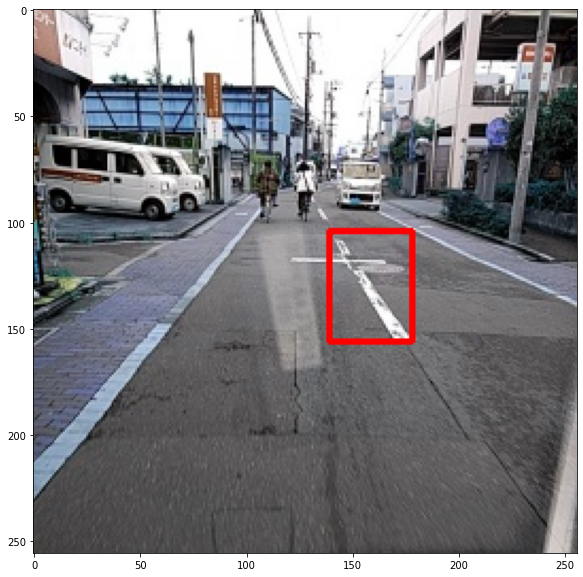

In [ ]:
image = cv2.imread('/content/Adachi_20170906093900.jpg')
w,h,c = image.shape
color = (255, 0, 0)
start_point = (139, 104)
end_point = (178, 156)
thickness = 2
image = cv2.rectangle(image, start_point, end_point, color, thickness)
plt.figure(figsize=(2,2))
f, (ax1) = plt.subplots(1,1, figsize=(10, 10))
ax1.imshow(image)

In [ ]:
image_src = '/content/drive/MyDrive/road/temp/test/test'
image_dst = '/content/drive/MyDrive/road/data/images/test'
xml_path = '/content/drive/MyDrive/road/data/annotations/test'

txt_paths = '/content/drive/MyDrive/road/temp/label-test/label test/label test'

txt_list = glob.glob(os.path.join(txt_paths, '*.txt'))
print(len(txt_list))
num_corrupted = 0
corrupted = []
num_classes = 0
for txt_file_path in txt_list:
  data = read_txt(txt_file_path)
  err, has_unvalid, max_label = txt2xml(data, txt_file_path, image_src ,image_dst ,xml_path, w=256, h=256, resize=True)
  if max_label>num_classes:
    num_classes = max_label
  if err or has_unvalid:
    num_corrupted += 1
    corrupted.append(txt_file_path)
    print('err',err, 'has_unvalid', has_unvalid, ' --> num_corrupted', num_corrupted)
print(corrupted)
print('number of classes', num_classes+1)
print(num_corrupted/len(txt_list)*100)

820
[]
number of classes 8.0
0.0


In [ ]:
num_classes

7.0

In [ ]:
image_src = '/content/drive/MyDrive/road/temp/train/train'
image_dst = '/content/drive/MyDrive/road/data/images/train'
xml_path = '/content/drive/MyDrive/road/data/annotations/train'

txt_paths = '/content/drive/MyDrive/road/temp/label train/label train/train'
set_ = 'train'
txt_list = glob.glob(os.path.join(txt_paths, '*.txt'))
num_corrupted = 0
corrupted = []
num_classes = 0
for txt_file_path in txt_list:
  data = read_txt(txt_file_path)
  err, has_unvalid, max_label = txt2xml(data, txt_file_path, image_src ,image_dst ,xml_path, w=256, h=256, resize=True)
  if max_label>num_classes:
    num_classes = max_label
  if err or has_unvalid:
    num_corrupted += 1
    corrupted.append(txt_file_path)
    print('err',err, 'has_unvalid', has_unvalid, ' --> num_corrupted', num_corrupted)
print(corrupted)
print('number of classes', num_classes+1)
print(num_corrupted/len(txt_list)*100)


[]
number of classes 8.0
0.0


In [ ]:
image_src = '/content/drive/MyDrive/road/temp/val/val'
image_dst = '/content/drive/MyDrive/road/data/images/validation'
xml_path = '/content/drive/MyDrive/road/data/annotations/validation'

txt_paths = '/content/drive/MyDrive/road/temp/label val/label val/val'
set_ = 'train'
txt_list = glob.glob(os.path.join(txt_paths, '*.txt'))
num_corrupted = 0
corrupted = []
num_classes = 0
for txt_file_path in txt_list:
  data = read_txt(txt_file_path)
  err, has_unvalid, max_label = txt2xml(data, txt_file_path, image_src ,image_dst ,xml_path, w=256, h=256, resize=True)
  if max_label>num_classes:
    num_classes = max_label
  if err or has_unvalid:
    num_corrupted += 1
    corrupted.append(txt_file_path)
    print('err',err, 'has_unvalid', has_unvalid, ' --> num_corrupted', num_corrupted)
print(corrupted)
print('number of classes', num_classes+1)
print(num_corrupted/len(txt_list)*100)


[]
number of classes 8.0
0.0


In [ ]:
with open('/content/drive/MyDrive/road/temp/label-test/label test/label test/Adachi_20170914152316.txt') as f:
    lines = f.readlines()

lines = [line.split('\n')[0] for line in lines]

In [ ]:
lines

['0 0.7508333333333334 0.6266666666666667 0.4783333333333334 0.7466666666666667']

In [ ]:
data = []
for i, line in enumerate(lines):
  splited = line.split(' ')
  splited = [float(d) for d in splited]
  data.append(splited)
data

[[0.0,
  0.7508333333333334,
  0.6266666666666667,
  0.4783333333333334,
  0.7466666666666667]]

In [ ]:
start_point

(466.00000000000006, 654.0)

In [ ]:
corrupted[20]

'/content/drive/MyDrive/road/temp/label-test/label test/label test/Adachi_20170914152316.txt'

In [ ]:
img = cv2.imread('/content/drive/MyDrive/road/temp/test/test/Adachi_20170914152316.jpg')
img.shape

(600, 600, 3)

(306, 152)
(593, 600)


<Figure size 144x144 with 0 Axes>

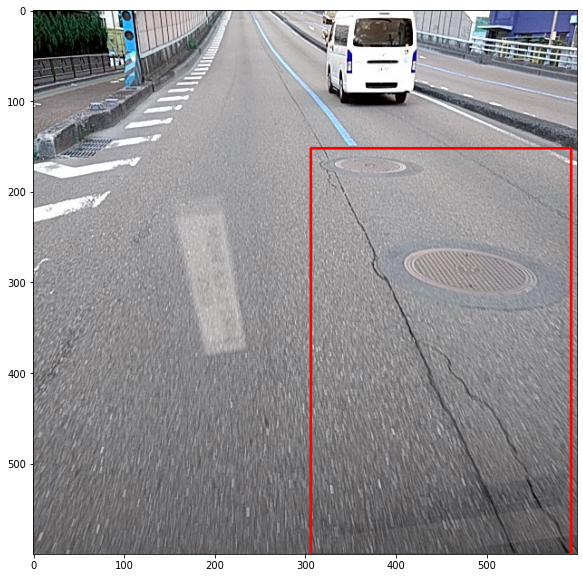

In [ ]:
path = '/content/drive/MyDrive/road/temp/test/test/Adachi_20170914152316.jpg'
image = cv2.imread(path)
w,h,c = image.shape
color = (255, 0, 0)
x = int(w*data[0][1])
y = int(h*data[0][2])
w = int(w*data[0][3])
h = int(h*data[0][4])
start_point = (int(x-w/2),int(y-h/2))
print(start_point)
end_point = (int(x+w/2),int(y+h/2))
print(end_point)
thickness = 2
image = cv2.rectangle(image, start_point, end_point, color, thickness)
plt.figure(figsize=(2,2))
f, (ax1) = plt.subplots(1,1, figsize=(10, 10))
ax1.imshow(image)

# Anchor boxes

In [ ]:
def parse_xml(xml_path):
    '''
    Parse XML files in PASCAL VOC format.
    
    Parameters
    ----------
    - xml_path : path to xml file
    
    Returns
    -------
    - image_name, width, height, bboxes    
    '''
    
    bboxes = []
    tree = ET.parse(xml_path)
    for elem in tree.iter(): 
        if 'filename' in elem.tag:
          image_name = elem.text
        if 'width' in elem.tag:
            w = int(elem.text)
        if 'height' in elem.tag:
            h = int(elem.text)
        if 'object' in elem.tag or 'part' in elem.tag:                  
            box = np.zeros((5), dtype=np.int32)
            for attr in list(elem):
              if 'name' in attr.tag:
                  box[0] = str(int(attr.text))
              if 'bndbox' in attr.tag:
                  for dim in list(attr):
                      if 'xmin' in dim.tag:
                          box[1] = int(round(float(dim.text)))
                      if 'ymin' in dim.tag:
                          box[2] = int(round(float(dim.text)))
                      if 'xmax' in dim.tag:
                          box[3] = int(round(float(dim.text)))
                      if 'ymax' in dim.tag:
                          box[4] = int(round(float(dim.text)))
                  bboxes.append(np.asarray(box))
            
    return image_name, w, h, bboxes    

In [ ]:
parse_xml('/content/drive/MyDrive/road/data/annotations/test/Adachi_20170908093820.xml')

('Adachi_20170908093820.jpg',
 256,
 256,
 [array([  1, 128, 104, 141, 134], dtype=int32),
  array([  1, 174, 109, 255, 224], dtype=int32)])

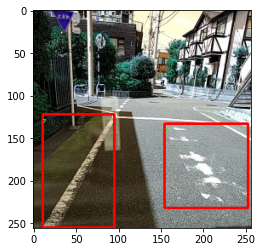

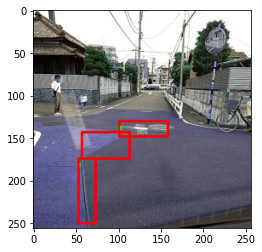

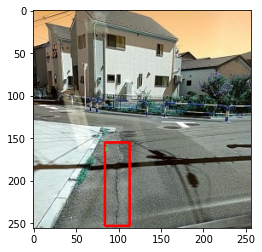

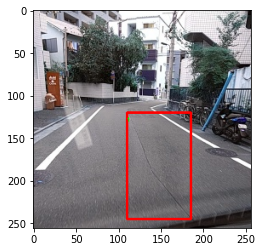

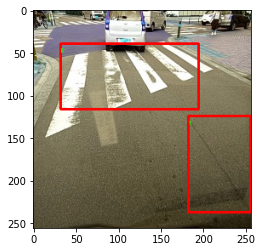

...

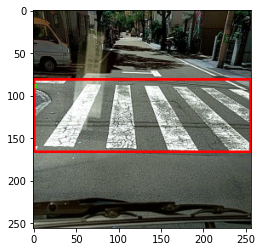

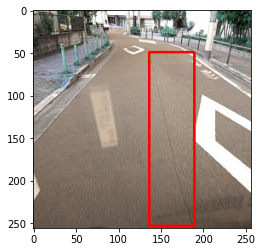

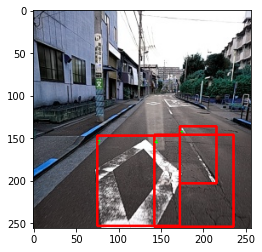

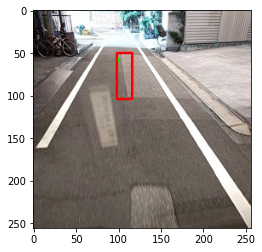

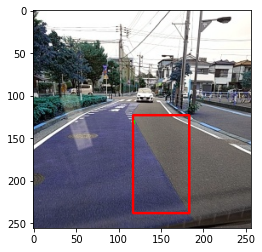

total train num is: 6505
avg total_width is 256.0, avg total_height is 256.0
avg bbox width is 87.8523435383365, avg bbox height is 69.52650591528945 
min bbox size is 45, max bbox size is 48192
class_static show below: {'0': 1998, '1': 2686, '2': 521, '3': 456, '4': 1887, '5': 281, '6': 596, '7': 2648}


In [ ]:
import matplotlib.pyplot as plt
import cv2 as cv
import os
train_annotation_path = '/content/drive/MyDrive/road/data/annotations/train' # Path of training set annotation
train_image_path = '/content/drive/MyDrive/road/data/images/train'       # Path to training set image
# Number of pictures displayed
show_num = 12
#Open xml document
def read_voc(train_annotation_path, train_image_path, show_num):
    """
    train_annotation_path:Training set annotation Path of
    train_image_path: Path to training set image
    show_num: Show the size of the picture
    """
    # Used to count the length and width of the picture
    total_width, total_height = 0, 0
    # Used to count the picture bbox length and width
    bbox_total_width, bbox_total_height, bbox_num = 0, 0, 0
    min_bbox_size = 40000
    max_bbox_size = 0
    # It is used to count the length and width of the image used for clustering, bbox length and width
    img_wh = []
    bbox_wh = []
    # Tag for statistics
    total_size = []
    class_static = {'0': 0, '1': 0, '2': 0, '3': 0, '4': 0, '5': 0, '6': 0, '7': 0}
    num_index = 0

    for root, dirs, files in os.walk(train_annotation_path):
        for file in files:
            num_index += 1
            xml_path = os.path.join(root, file)
            image_name, width, height, bboxes = parse_xml(xml_path)
            image_path = os.path.join(train_image_path, image_name)
            img_wh.append([width, height])
            total_width += width
            total_height += height

            # If you need to show, read the picture
            if num_index < show_num:
                image_path = os.path.join(train_image_path, image_name)
                image = cv.imread(image_path)
            # Statistics about bbox
            wh = []
            for bbox in bboxes:
                class_name = str(bbox[0])
                class_static[class_name] += 1
                x1, y1, x2, y2 = bbox[1], bbox[2], bbox[3], bbox[4]
                bbox_width = x2 - x1
                bbox_height = y2 - y1
                bbox_size = bbox_width*bbox_height
                # Statistics of the maximum and minimum dimensions of bbox
                if min_bbox_size > bbox_size:
                    min_bbox_size = bbox_size
                if max_bbox_size < bbox_size:
                    max_bbox_size = bbox_size
                total_size.append(bbox_size)
                # Statistical bbox average size
                bbox_total_width += bbox_width
                bbox_total_height += bbox_height
                # For clustering use
                wh.append([bbox_width / width, bbox_height / height])   # Relative coordinates
                bbox_num += 1
                # Draw a box if necessary
                if num_index < show_num:
                    cv.rectangle(image, (x1, y1), (x2, y2), color=(255, 0, 0), thickness=2)
                    cv.putText(image, class_name, (x1, y1+10), cv.FONT_HERSHEY_SIMPLEX, fontScale=0.2, color=(0, 255, 0), thickness=1)
            bbox_wh.append(wh)
            # If you need to show
            if num_index < show_num:
                plt.figure()
                plt.imshow(image)
                plt.show()
     

    # Remove 2 inspection files                
    # num_index -= 2
    print("total train num is: {}".format(num_index))
    print("avg total_width is {}, avg total_height is {}".format((total_width / num_index), (total_height / num_index)))
    print("avg bbox width is {}, avg bbox height is {} ".format((bbox_total_width / bbox_num), (bbox_total_height / bbox_num)))
    print("min bbox size is {}, max bbox size is {}".format(min_bbox_size, max_bbox_size))
    print("class_static show below:", class_static)

    return img_wh, bbox_wh

img_wh, bbox_wh = read_voc(train_annotation_path, train_image_path, show_num) 

In [ ]:
bbox_wh[2]

[[0.11328125, 0.3828125]]

In [ ]:
bboxes_wh = []
for boxes in bbox_wh:
  for b in boxes:
    bboxes_wh.append(b)
bboxes_wh = np.array(bboxes_wh)
bboxes_wh.shape

(11073, 2)

In [ ]:
def wh_iou(box, clusters):
  '''
  :param box:      np.array of shape (2,) containing w and h
  :param clusters: np.array of shape (N cluster, 2) 
  '''
  x = np.minimum(clusters[:, 0], box[0]) 
  y = np.minimum(clusters[:, 1], box[1])

  intersection = x * y
  box_area = box[0] * box[1]
  cluster_area = clusters[:, 0] * clusters[:, 1]

  iou_ = intersection / (box_area + cluster_area - intersection)

  return iou_

In [ ]:
wh_iou(bboxes_wh[0,:], bboxes_wh[1:6,:])

array([0.66220736, 0.17893218, 0.10575139, 0.15666873, 0.29292929])

In [ ]:
def k_means(boxes, k, dist=np.median):
  """
  yolo k-means methods
  Args:
      boxes: Need clustering bboxes,bboxes by n*2 contain w，h
      k: Number of clusters(Gather into several categories)
      dist: Method of updating cluster coordinates(The median is used by default, which is slightly better than the mean)
  """
  box_number = boxes.shape[0]
  last_nearest = np.zeros((box_number,))
  clusters = boxes[np.random.choice(box_number, k, replace=False)]
  
  # print(clusters)
  while True:
    # Calculate the distance 1-IOU(bboxes, anchors) from each bboxes to each cluster
    ious = np.zeros((boxes.shape[0], k))
    for i in range(boxes.shape[0]):
      ious[i,:] = wh_iou(boxes[i,:], clusters)
    distances = 1.0 - ious
    # Calculate the nearest cluster center of each bboxes
    current_nearest = np.argmin(distances, axis=1)
    # If the elements in each cluster are not changing, it indicates that the clustering is completed
    if (last_nearest == current_nearest).all():
      break  # clusters won't change
    for cluster in range(k):
      # Recalculate the cluster center according to the bboxes in each cluster
      clusters[cluster] = dist(boxes[current_nearest == cluster], axis=0)

    last_nearest = current_nearest

  return clusters

In [ ]:
clusters = k_means(bboxes_wh, 5, dist=np.median)
print(clusters)
clusters = clusters.reshape(-1,)
clusters = clusters.tolist()
print(clusters)

[[0.10546875 0.12890625]
 [0.78515625 0.35546875]
 [0.328125   0.36328125]
 [0.46484375 0.0859375 ]
 [0.1796875  0.2421875 ]]
[0.10546875, 0.12890625, 0.78515625, 0.35546875, 0.328125, 0.36328125, 0.46484375, 0.0859375, 0.1796875, 0.2421875]


In [ ]:
anchs.shape

(5, 2)

In [ ]:
anchors = [[0.78515625, 0.35546875],
           [0.1015625, 0.12890625],
           [0.328125, 0.36328125],
           [0.4609375, 0.0859375 ],
           [0.1796875, 0.2421875 ]]
anchs = np.array(anchors)
anchs = anchs[np.argsort(anchs[:,0])]
print(anchs)
anchs = anchs.reshape(-1,)
print(anchs.tolist())

[[0.1015625  0.12890625]
 [0.1796875  0.2421875 ]
 [0.328125   0.36328125]
 [0.4609375  0.0859375 ]
 [0.78515625 0.35546875]]
[0.1015625, 0.12890625, 0.1796875, 0.2421875, 0.328125, 0.36328125, 0.4609375, 0.0859375, 0.78515625, 0.35546875]


In [ ]:
anchs = [0.1015625, 0.12890625, 0.1796875, 0.2421875, 0.328125, 0.36328125, 0.4609375, 0.0859375, 0.78515625, 0.35546875]
rescaled_anchs = [c*256/32 for c in anchs]
print(rescaled_anchs)

[0.8125, 1.03125, 1.4375, 1.9375, 2.625, 2.90625, 3.6875, 0.6875, 6.28125, 2.84375]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 144x144 with 0 Axes>

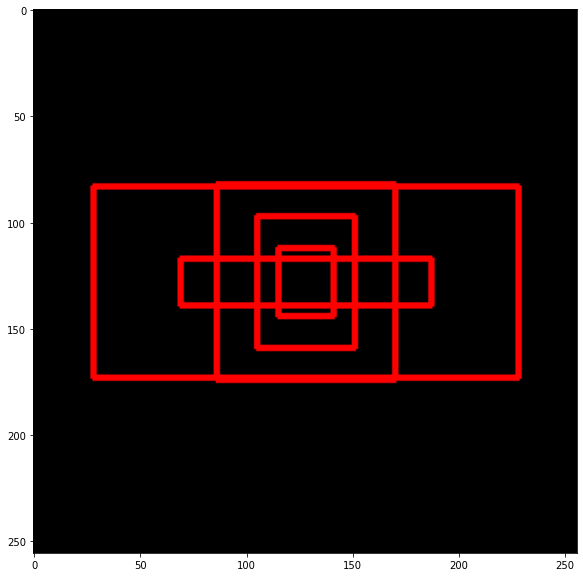

In [ ]:
image = np.zeros((256,256,3))
anchors = [[0.78515625, 0.35546875],
           [0.1015625, 0.12890625],
           [0.328125, 0.36328125],
           [0.4609375, 0.0859375 ],
           [0.1796875, 0.2421875 ]]
w,h,c = image.shape
color = (255, 0, 0)
thickness = 2
for i in range(5):
  start_point = (128-int(anchors[i][0]*128), 128-int(anchors[i][1]*128))
  end_point = (128+int(anchors[i][0]*128), 128+int(anchors[i][1]*128))
  image = cv2.rectangle(image, start_point, end_point, color, thickness)
plt.figure(figsize=(2,2))
f, (ax1) = plt.subplots(1,1, figsize=(10, 10))
ax1.imshow(image)

(5, 2)

# Model HyperParams

In [ ]:
LABELS           = [str(i) for i in range(8)]
IMAGE_H, IMAGE_W = 256, 256
GRID_H,  GRID_W  = 8,8
BOX              = 5
CLASS            = len(LABELS)
SCORE_THRESHOLD  = 0.5
IOU_THRESHOLD    = 0.45
ANCHORS          = [0.8125, 1.03125, 1.4375, 1.9375, 2.625, 2.90625, 3.6875, 0.6875, 6.28125, 2.84375]

TRAIN_BATCH_SIZE = 10
VAL_BATCH_SIZE   = 10
EPOCHS           = 1000

LAMBDA_NOOBJECT  = 0.7
LAMBDA_OBJECT    = 2
LAMBDA_CLASS     = 0.7
LAMBDA_COORD     = 0.7

max_annot        = 0

# Yolo Class

In [ ]:
from tensorflow.keras.models import Model
class YOLO(object):
  def __init__(self, input_size,  labels,  max_box_per_image, anchors):

    self.input_size = input_size
    
    self.labels   = labels
    self.nb_class = len(self.labels)
    self.nb_box   = len(anchors)//2
    self.class_wt = np.ones(self.nb_class, dtype='float32')
    self.anchors  = anchors

    self.max_box_per_image = max_box_per_image
    
    base_model = ResNet50V2(input_shape=input_size, weights = 'imagenet', pooling='', include_top=False)
    
    for layer in base_model.layers:
      layer.trainable = True
    self.model = tf.keras.Sequential()
    self.model.add(base_model)
    self.model.add(Conv2D(BOX * (4 + 1 + self.nb_class), 
                          (1,1), strides=(1,1), 
                          padding='same', 
                          name='DetectionLayer'))
    self.model.add(Reshape((GRID_H,  GRID_W, BOX, 4 + 1 + self.nb_class)))
    
    # print a summary of the whole model
    self.model.summary()
  def iou(self, x1, y1, w1, h1, x2, y2, w2, h2):
    '''
    Calculate IOU between box1 and box2

    Parameters
    ----------
    - x, y : box center coords
    - w : box width
    - h : box height
    
    Returns
    -------
    - IOU
    '''   
    xmin1 = x1 - 0.5*w1
    xmax1 = x1 + 0.5*w1
    ymin1 = y1 - 0.5*h1
    ymax1 = y1 + 0.5*h1
    xmin2 = x2 - 0.5*w2
    xmax2 = x2 + 0.5*w2
    ymin2 = y2 - 0.5*h2
    ymax2 = y2 + 0.5*h2
    interx = np.minimum(xmax1, xmax2) - np.maximum(xmin1, xmin2)
    intery = np.minimum(ymax1, ymax2) - np.maximum(ymin1, ymin2)
    inter = interx * intery
    union = w1*h1 + w2*h2 - inter
    iou = inter / (union + 1e-6)
    return iou
      
  def yolov2_loss(self, detector_mask, matching_true_boxes, class_one_hot, true_boxes_grid, y_pred):
    '''
    Calculate YOLO V2 loss from prediction (y_pred) and ground truth tensors (detector_mask,
    matching_true_boxes, class_one_hot, true_boxes_grid,)

    Parameters
    ----------
    - detector_mask : tensor, shape (batch, size, GRID_W, GRID_H, anchors_count, 1)
        1 if bounding box detected by grid cell, else 0
    - matching_true_boxes : tensor, shape (batch_size, GRID_W, GRID_H, anchors_count, 5)
        Contains adjusted coords of bounding box in YOLO format
    - class_one_hot : tensor, shape (batch_size, GRID_W, GRID_H, anchors_count, class_count)
        One hot representation of bounding box label
    - true_boxes_grid : annotations : tensor (shape : batch_size, max annot, 5)
        true_boxes_grid format : x, y, w, h, c (coords unit : grid cell)
    - y_pred : prediction from model. tensor (shape : batch_size, GRID_W, GRID_H, anchors count, (5 + labels count)
    - info : boolean. True to get some infox about loss value
    
    Returns
    -------
    - loss : scalar
    - sub_loss : sub loss list : coords loss, class loss and conf loss : scalar
    '''
    
    # anchors tensor
    anchors = np.array(ANCHORS)
    anchors = anchors.reshape(len(anchors) // 2, 2)
    
    # grid coords tensor
    coord_x = tf.cast(tf.reshape(tf.tile(tf.range(GRID_W), [GRID_H]), (1, GRID_H, GRID_W, 1, 1)), tf.float32)
    coord_y = tf.transpose(coord_x, (0,2,1,3,4))
    coords = tf.tile(tf.concat([coord_x,coord_y], -1), [y_pred.shape[0], 1, 1, 5, 1])
    
    # coordinate loss
    pred_xy = K.sigmoid(y_pred[:,:,:,:,0:2]) # adjust coords between 0 and 1
    pred_xy = (pred_xy + coords) # add cell coord for comparaison with ground truth. New coords in grid cell unit
    pred_wh = K.exp(y_pred[:,:,:,:,2:4]) * anchors # adjust width and height for comparaison with ground truth. New coords in grid cell unit
    #pred_wh = (pred_wh * anchors) # unit : grid cell
    nb_detector_mask = K.sum(tf.cast(detector_mask > 0.0, tf.float32))
    xy_loss = LAMBDA_COORD * K.sum(detector_mask * K.square(matching_true_boxes[...,:2] - pred_xy)) / (nb_detector_mask + 1e-6) # Non /2
    wh_loss = LAMBDA_COORD * K.sum(detector_mask * K.square(K.sqrt(matching_true_boxes[...,2:4]) - 
                                                            K.sqrt(pred_wh))) / (nb_detector_mask + 1e-6)
    coord_loss = xy_loss + wh_loss
    
    # class loss    
    pred_box_class = y_pred[..., 5:]
    true_box_class = tf.argmax(class_one_hot, -1)
    #class_loss = tf.nn.sparse_softmax_cross_entropy_with_logits(labels=true_box_class, logits=pred_box_class)
    class_loss = K.sparse_categorical_crossentropy(target=true_box_class, output=pred_box_class, from_logits=True)
    class_loss = K.expand_dims(class_loss, -1) * detector_mask
    class_loss = LAMBDA_CLASS * K.sum(class_loss) / (nb_detector_mask + 1e-6)
    
    # confidence loss
    pred_conf = K.sigmoid(y_pred[...,4:5])
    # for each detector : iou between prediction and ground truth
    x1 = matching_true_boxes[...,0]
    y1 = matching_true_boxes[...,1]
    w1 = matching_true_boxes[...,2]
    h1 = matching_true_boxes[...,3]
    x2 = pred_xy[...,0]
    y2 = pred_xy[...,1]
    w2 = pred_wh[...,0]
    h2 = pred_wh[...,1]
    ious = self.iou(x1, y1, w1, h1, x2, y2, w2, h2)
    ious = K.expand_dims(ious, -1)
    
    # for each detector : best ious between prediction and true_boxes (every bounding box of image)
    pred_xy = K.expand_dims(pred_xy, 4) # shape : m, GRID_W, GRID_H, BOX, 1, 2 
    pred_wh = K.expand_dims(pred_wh, 4)
    pred_wh_half = pred_wh / 2.
    pred_mins = pred_xy - pred_wh_half
    pred_maxes = pred_xy + pred_wh_half
    true_boxe_shape = K.int_shape(true_boxes_grid)
    true_boxes_grid = K.reshape(true_boxes_grid, [true_boxe_shape[0], 1, 1, 1, true_boxe_shape[1], true_boxe_shape[2]])
    true_xy = true_boxes_grid[...,0:2]
    true_wh = true_boxes_grid[...,2:4]
    true_wh_half = true_wh * 0.5
    true_mins = true_xy - true_wh_half
    true_maxes = true_xy + true_wh_half
    intersect_mins = K.maximum(pred_mins, true_mins) # shape : m, GRID_W, GRID_H, BOX, max_annot, 2 
    intersect_maxes = K.minimum(pred_maxes, true_maxes) # shape : m, GRID_W, GRID_H, BOX, max_annot, 2
    intersect_wh = K.maximum(intersect_maxes - intersect_mins, 0.) # shape : m, GRID_W, GRID_H, BOX, max_annot, 1
    intersect_areas = intersect_wh[..., 0] * intersect_wh[..., 1] # shape : m, GRID_W, GRID_H, BOX, max_annot, 1
    pred_areas = pred_wh[..., 0] * pred_wh[..., 1] # shape : m, GRID_W, GRID_H, BOX, 1, 1
    true_areas = true_wh[..., 0] * true_wh[..., 1] # shape : m, GRID_W, GRID_H, BOX, max_annot, 1
    union_areas = pred_areas + true_areas - intersect_areas
    iou_scores = intersect_areas / union_areas # shape : m, GRID_W, GRID_H, BOX, max_annot, 1
    best_ious = K.max(iou_scores, axis=4)  # Best IOU scores.
    best_ious = K.expand_dims(best_ious) # shape : m, GRID_W, GRID_H, BOX, 1
    
    # no object confidence loss
    no_object_detection = K.cast(best_ious < 0.6, K.dtype(best_ious)) 
    noobj_mask = no_object_detection * (1 - detector_mask)
    nb_noobj_mask  = K.sum(tf.cast(noobj_mask  > 0.0, tf.float32))
    
    noobject_loss =  LAMBDA_NOOBJECT * K.sum(noobj_mask * K.square(-pred_conf)) / (nb_noobj_mask + 1e-6)
    # object confidence loss
    object_loss = LAMBDA_OBJECT * K.sum(detector_mask * K.square(ious - pred_conf)) / (nb_detector_mask + 1e-6)
    # total confidence loss
    conf_loss = noobject_loss + object_loss
    
    # total loss
    loss = conf_loss + class_loss + coord_loss
    sub_loss = [conf_loss, class_loss, coord_loss]  
    
    return loss, sub_loss
  def display_yolo(self, file, model, score_threshold, iou_threshold, disp=False, img = None):
    '''
    Display predictions from YOLO model.

    Parameters
    ----------
    - file : string list : list of images path.
    - model : YOLO model.
    - score_threshold : threshold used for filtering predicted bounding boxes.
    - iou_threshold : threshold used for non max suppression.
    '''
    # load image
    if img is None:
      image = cv2.imread(file)
      image_copy = image.copy()
    else:
      image = img.copy()
      image_copy = img.copy()

    #input_image = image[:,:,::-1]
    input_image = image / 255.
    input_image = np.expand_dims(input_image, 0)

    # prediction
    y_pred = model.predict_on_batch(input_image)

    # post prediction process
    # grid coords tensor
    coord_x = tf.cast(tf.reshape(tf.tile(tf.range(GRID_W), [GRID_H]), (1, GRID_H, GRID_W, 1, 1)), tf.float32)
    coord_y = tf.transpose(coord_x, (0,2,1,3,4))
    coords = tf.tile(tf.concat([coord_x,coord_y], -1), [TRAIN_BATCH_SIZE, 1, 1, 5, 1])
    dims = K.cast_to_floatx(K.int_shape(y_pred)[1:3])
    dims = K.reshape(dims,(1,1,1,1,2))
    # anchors tensor
    anchors = np.array(ANCHORS)
    anchors = anchors.reshape(len(anchors) // 2, 2)
    # pred_xy and pred_wh shape (m, GRID_W, GRID_H, Anchors, 2)
    pred_xy = K.sigmoid(y_pred[:,:,:,:,0:2])
    pred_xy = (pred_xy + coords)
    pred_xy = pred_xy / dims
    pred_wh = K.exp(y_pred[:,:,:,:,2:4])
    pred_wh = (pred_wh * anchors)
    pred_wh = pred_wh / dims
    # pred_confidence
    box_conf = K.sigmoid(y_pred[:,:,:,:,4:5])  
    # pred_class
    box_class_prob = K.softmax(y_pred[:,:,:,:,5:])

    # Reshape
    pred_xy = pred_xy[0,...]
    pred_wh = pred_wh[0,...]
    box_conf = box_conf[0,...]
    box_class_prob = box_class_prob[0,...]

    # Convert box coords from x,y,w,h to x1,y1,x2,y2
    box_xy1 = pred_xy - 0.5 * pred_wh
    box_xy2 = pred_xy + 0.5 * pred_wh
    boxes = K.concatenate((box_xy1, box_xy2), axis=-1)

    # Filter boxes
    box_scores = box_conf * box_class_prob
    box_classes = K.argmax(box_scores, axis=-1) # best score index
    box_class_scores = K.max(box_scores, axis=-1) # best score
    prediction_mask = box_class_scores >= score_threshold
    boxes = tf.boolean_mask(boxes, prediction_mask)
    scores = tf.boolean_mask(box_class_scores, prediction_mask)
    classes = tf.boolean_mask(box_classes, prediction_mask)

    # Scale box to image shape
    boxes = boxes * IMAGE_H

    # Non Max Supression
    selected_idx = tf.image.non_max_suppression(boxes, scores, 50, iou_threshold=iou_threshold)
    boxes = K.gather(boxes, selected_idx)
    scores = K.gather(scores, selected_idx)
    classes = K.gather(classes, selected_idx)
    w,h,c = image.shape
    
    thickness = 2
    font = cv2.FONT_HERSHEY_SIMPLEX
    fontScale = 1
    # Draw image
    count_detected = boxes.shape[0]
    if disp:
      plt.figure(figsize=(2,2))
      f, (ax1) = plt.subplots(1,1, figsize=(10, 10))
      ax1.imshow(image[:,:,::-1])
      ax1.set_title('Detected objects count : {}'.format(count_detected))
    colors = [(0,0, 255), (0,255, 0), (255, 0, 0), (255, 150, 50), (50, 255, 90), (90, 155, 255), (0, 0, 0), (90, 90, 165) ]
    for i in range(count_detected):
      box = boxes[i,...]
      x = box[0]
      y = box[1]
      w = box[2] - box[0]
      h = box[3] - box[1]
      clas = (classes[i].numpy()) + 1

      color = colors[clas-1]
      start_point = (box[0], box[1])
      end_point = (box[2], box[3])
      image_copy = cv2.rectangle(image_copy, start_point, end_point, color, thickness)
      image_copy = cv2.putText(image_copy, str(clas)+': {score:.3f}'.format(score=scores[i]), start_point, font, fontScale, color, thickness, cv2.LINE_AA)
      
      if disp:
        color = (np.random.rand(), np.random.rand(), np.random.rand())
        ax1.annotate(clas, xy=(box[2], box[1]), color = color)
        rect = patches.Rectangle((x.numpy(), y.numpy()), w.numpy(), h.numpy(), linewidth = 3, edgecolor=color,facecolor='none')
        ax1.add_patch(rect)
    return image_copy
      
          

In [ ]:
input_size = (IMAGE_H, IMAGE_W, 3)

yolo = YOLO(input_size,  LABELS,  BOX, ANCHORS)
model = yolo.model

94683136/94668760 [==============================] - 1s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 8, 8, 2048)        23564800  
                                                                 
 DetectionLayer (Conv2D)     (None, 8, 8, 65)          133185    
                                                                 
 reshape (Reshape)           (None, 8, 8, 5, 13)       0         
                                                                 
Total params: 23,697,985
Trainable params: 23,652,545
Non-trainable params: 45,440
_________________________________________________________________


In [ ]:
model.load_weights('/content/drive/MyDrive/road/model/train0_1.1036549.h5')

<Figure size 144x144 with 0 Axes>

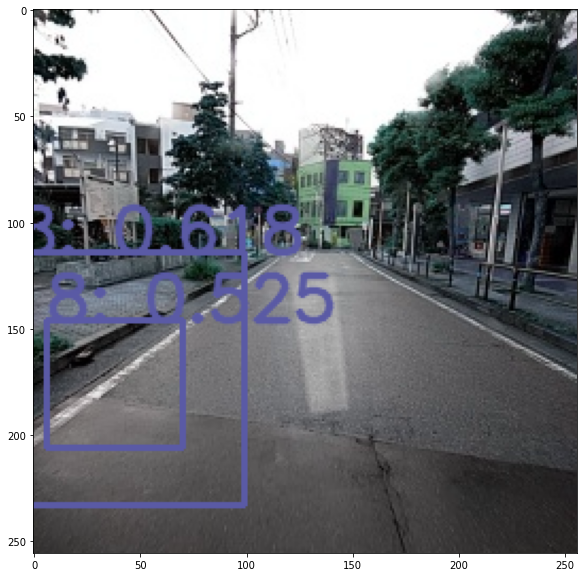

In [ ]:
img_val = '/content/drive/MyDrive/road/data/images/validation/Adachi_20170906150707.jpg'
img_pred = yolo.display_yolo(img_val, model, 0.5, 0.3,disp=False)

plt.figure(figsize=(2,2))
f, (ax1) = plt.subplots(1,1, figsize=(10, 10))
ax1.imshow(img_pred)

# database Generator

In [ ]:
def parse_annotation(ann_dir, img_dir, labels):
    '''
    Parse XML files in PASCAL VOC format.
    
    Parameters
    ----------
    - ann_dir : annotations files directory
    - img_dir : images files directory
    - labels : labels list
    
    Returns
    -------
    - imgs_name : numpy array of images files path (shape : images count, 1)
    - true_boxes : numpy array of annotations for each image (shape : image count, max annotation count, 5)
        annotation format : xmin, ymin, xmax, ymax, class
        xmin, ymin, xmax, ymax : image unit (pixel)
        class = label index
    '''
    
    max_annot = 0
    imgs_name = []
    annots = []
    
    # Parse file
    for ann in sorted(os.listdir(ann_dir)):
        annot_count = 0
        boxes = []
        tree = ET.parse(os.path.join(ann_dir, ann))
        for elem in tree.iter(): 
            if 'filename' in elem.tag:
                imgs_name.append(os.path.join(img_dir, elem.text))
            if 'width' in elem.tag:
                w = int(elem.text)
            if 'height' in elem.tag:
                h = int(elem.text)
            if 'object' in elem.tag or 'part' in elem.tag:                  
                box = np.zeros((5))
                for attr in list(elem):
                    if 'name' in attr.tag:
                        box[4] = labels.index(attr.text) + 1 # 0:label for no bounding box
                    if 'bndbox' in attr.tag:
                        annot_count += 1
                        for dim in list(attr):
                            if 'xmin' in dim.tag:
                                box[0] = int(round(float(dim.text)))
                            if 'ymin' in dim.tag:
                                box[1] = int(round(float(dim.text)))
                            if 'xmax' in dim.tag:
                                box[2] = int(round(float(dim.text)))
                            if 'ymax' in dim.tag:
                                box[3] = int(round(float(dim.text)))
                boxes.append(np.asarray(box))
        
        if w != IMAGE_W or h != IMAGE_H :
            print('Image size error')
            break
            
        annots.append(np.asarray(boxes))
        

        if annot_count > max_annot:
            max_annot = annot_count
           
    # Rectify annotations boxes : len -> max_annot
    imgs_name = np.array(imgs_name)  
    true_boxes = np.zeros((imgs_name.shape[0], max_annot, 5))
    print(max_annot)
    for idx, boxes in enumerate(annots):
        true_boxes[idx, :boxes.shape[0], :] = boxes
        
    return imgs_name, true_boxes

In [ ]:
def parse_function(img_obj, true_boxes):
    x_img_string = tf.io.read_file(img_obj)
    x_img = tf.image.decode_png(x_img_string, channels=3) # dtype=tf.uint8
    x_img = tf.image.convert_image_dtype(x_img, tf.float32) # pixel value /255, dtype=tf.float32, channels : RGB
    return x_img, true_boxes

def get_dataset(img_dir, ann_dir, labels, batch_size):
    '''
    Create a YOLO dataset
    
    Parameters
    ----------
    - ann_dir : annotations files directory
    - img_dir : images files directory
    - labels : labels list
    - batch_size : int
    
    Returns
        batch : tupple(images, annotations)
        images : tensor (shape : batch_size, IMAGE_W, IMAGE_H, 3)
        annotations : tensor (shape : batch_size, max annot, 5)
    '''
    
    imgs_name, bbox = parse_annotation(ann_dir, img_dir, LABELS)
    dataset = tf.data.Dataset.from_tensor_slices((imgs_name, bbox))  
    
    dataset = dataset.map(parse_function, num_parallel_calls=tf.data.experimental.AUTOTUNE).shuffle(1000, reshuffle_each_iteration=True).prefetch(100)
    dataset = dataset.batch(batch_size).repeat()#,drop_remainder=True).repeat()
    print('-------------------')
    print('Dataset Info:')
    print('Images count: {}'.format(len(imgs_name)))
    print('Step per epoch: {}'.format(len(imgs_name) // batch_size))
    print('Images per epoch: {}'.format(batch_size * (len(imgs_name) // batch_size)))
    return dataset

def get_test_val_dataset(img_dir, ann_dir, labels, batch_size):
    '''
    Create a YOLO dataset
    
    Parameters
    ----------
    - ann_dir : annotations files directory
    - img_dir : images files directory
    - labels : labels list
    - batch_size : int
    
    Returns
        batch : tupple(images, annotations)
        images : tensor (shape : batch_size, IMAGE_W, IMAGE_H, 3)
        annotations : tensor (shape : batch_size, max annot, 5)
    '''
    
    imgs_name, bbox = parse_annotation(ann_dir, img_dir, LABELS)
    dataset = tf.data.Dataset.from_tensor_slices((imgs_name, bbox))  
    
    dataset = dataset.map(parse_function, num_parallel_calls=tf.data.experimental.AUTOTUNE)
    dataset = dataset.batch(batch_size).repeat()#,drop_remainder=True).repeat()
    print('-------------------')
    print('Dataset Info:')
    print('Images count: {}'.format(len(imgs_name)))
    print('Step per epoch: {}'.format(len(imgs_name) // batch_size))
    print('Images per epoch: {}'.format(batch_size * (len(imgs_name) // batch_size)))
    return dataset

In [ ]:
train_image_folder = '/content/drive/MyDrive/road/data/images/train'
train_annot_folder = '/content/drive/MyDrive/road/data/annotations/train'
val_image_folder = '/content/drive/MyDrive/road/data/images/validation'
val_annot_folder = '/content/drive/MyDrive/road/data/annotations/validation'
test_image_folder = '/content/drive/MyDrive/road/data/images/test'
test_annot_folder = '/content/drive/MyDrive/road/data/annotations/test'

In [ ]:
train_dataset = None
train_dataset= get_dataset(train_image_folder, train_annot_folder, LABELS, TRAIN_BATCH_SIZE)

val_dataset = None
val_dataset= get_test_val_dataset(val_image_folder, val_annot_folder, LABELS, VAL_BATCH_SIZE)

test_ds = None
test_ds= get_test_val_dataset(test_image_folder, test_annot_folder, LABELS, VAL_BATCH_SIZE)

8
-------------------
Dataset Info:
Images count: 6505
Step per epoch: 650
Images per epoch: 6500
6
-------------------
Dataset Info:
Images count: 1625
Step per epoch: 162
Images per epoch: 1620
5
-------------------
Dataset Info:
Images count: 796
Step per epoch: 79
Images per epoch: 790


In [ ]:
steps_per_epoch_train = 650
steps_per_epoch_val = 162 

In [ ]:
def test_dataset(dataset):
    j=0
    for batch in dataset:
        img = batch[0][0]
        label = batch[1][0]
        plt.figure(figsize=(2,2))
        f, (ax1) = plt.subplots(1,1, figsize=(10, 10))
        ax1.imshow(img)
        ax1.set_title('Input image. Shape : {}'.format(img.shape))
        for i in range(label.shape[0]):
            box = label[i,:]
            box = box.numpy()
            x = box[0]
            y = box[1]
            w = box[2] - box[0]
            h = box[3] - box[1]

            color = (np.random.rand(), np.random.rand(), np.random.rand())
            clas = str(box[4])
            ax1.annotate(clas, xy=(box[2], box[1]), color = color)
            
            rect = patches.Rectangle((x, y), w, h, linewidth = 2, edgecolor=color, facecolor='none')
            ax1.add_patch(rect)
        j +=1
        if j==10:
          break

In [ ]:
test_dataset(train_dataset)

In [ ]:
def augmentation_generator(yolo_dataset):
    '''
    Augmented batch generator from a yolo dataset

    Parameters
    ----------
    - YOLO dataset
    
    Returns
    -------
    - augmented batch : tensor (shape : batch_size, IMAGE_W, IMAGE_H, 3)
        batch : tupple(images, annotations)
        batch[0] : images : tensor (shape : batch_size, IMAGE_W, IMAGE_H, 3)
        batch[1] : annotations : tensor (shape : batch_size, max annot, 5)
    '''
    for batch in yolo_dataset:
        # conversion tensor->numpy
        img = batch[0].numpy()
        boxes = batch[1]. numpy()
        # conversion bbox numpy->ia object
        ia_boxes = []
        for i in range(img.shape[0]):
            ia_bbs = [ia.BoundingBox(x1=bb[0],
                                       y1=bb[1],
                                       x2=bb[2],
                                       y2=bb[3]) for bb in boxes[i]
                      if (bb[0] + bb[1] +bb[2] + bb[3] > 0)]
            ia_boxes.append(ia.BoundingBoxesOnImage(ia_bbs, shape=(IMAGE_W, IMAGE_H)))
        # data augmentation
        seq = iaa.Sequential([
            iaa.Fliplr(0.5),
            iaa.Flipud(0.5),
            iaa.Multiply((0.4, 1.6)), # change brightness
            #iaa.ContrastNormalization((0.5, 1.5)),
            #iaa.Affine(translate_px={"x": (-100,100), "y": (-100,100)}, scale=(0.7, 1.30))
            ])
        #seq = iaa.Sequential([])
        seq_det = seq.to_deterministic()
        img_aug = seq_det.augment_images(img)
        img_aug = np.clip(img_aug, 0, 1)
        boxes_aug = seq_det.augment_bounding_boxes(ia_boxes)
        # conversion ia object -> bbox numpy
        for i in range(img.shape[0]):
            boxes_aug[i] = boxes_aug[i].remove_out_of_image().clip_out_of_image()
            for j, bb in enumerate(boxes_aug[i].bounding_boxes):
                boxes[i,j,0] = bb.x1
                boxes[i,j,1] = bb.y1
                boxes[i,j,2] = bb.x2
                boxes[i,j,3] = bb.y2
        # conversion numpy->tensor
        batch = (tf.convert_to_tensor(img_aug), tf.convert_to_tensor(boxes))
        #batch = (img_aug, boxes)
        yield batch

In [ ]:
aug_train_dataset = augmentation_generator(train_dataset)

In [ ]:
test_dataset(aug_train_dataset)

In [ ]:
def process_true_boxes(true_boxes, anchors, image_width, image_height):
    '''
    Build image ground truth in YOLO format from image true_boxes and anchors.
    
    Parameters
    ----------
    - true_boxes : tensor, shape (max_annot, 5), format : x1 y1 x2 y2 c, coords unit : image pixel
    - anchors : list [anchor_1_width, anchor_1_height, anchor_2_width, anchor_2_height...]
        anchors coords unit : grid cell
    - image_width, image_height : int (pixels)
    
    Returns
    -------
    - detector_mask : array, shape (GRID_W, GRID_H, anchors_count, 1)
        1 if bounding box detected by grid cell, else 0
    - matching_true_boxes : array, shape (GRID_W, GRID_H, anchors_count, 5)
        Contains adjusted coords of bounding box in YOLO format
    -true_boxes_grid : array, same shape than true_boxes (max_annot, 5),
        format : x, y, w, h, c, coords unit : grid cell
        
    Note:
    -----
    Bounding box in YOLO Format : x, y, w, h, c
    x, y : center of bounding box, unit : grid cell
    w, h : width and height of bounding box, unit : grid cell
    c : label index
    ''' 
    
    scale = IMAGE_W / GRID_W 
    
    anchors_count = len(anchors) // 2
    anchors = np.array(anchors)
    anchors = anchors.reshape(len(anchors) // 2, 2)
    
    detector_mask = np.zeros((GRID_W, GRID_H, anchors_count, 1))
    matching_true_boxes = np.zeros((GRID_W, GRID_H, anchors_count, 5))
    
    # convert true_boxes numpy array -> tensor
    true_boxes = true_boxes.numpy()
    
    true_boxes_grid = np.zeros(true_boxes.shape)
    
    # convert bounding box coords and localize bounding box
    for i, box in enumerate(true_boxes):
        # convert box coords to x, y, w, h and convert to grids coord
        w = (box[2] - box[0]) / scale
        h = (box[3] - box[1]) / scale    
        x = ((box[0] + box[2]) / 2) / scale
        y = ((box[1] + box[3]) / 2) / scale
        true_boxes_grid[i,...] = np.array([x, y, w, h, box[4]])
        if w * h > 0: # box exists
            # calculate iou between box and each anchors and find best anchors
            best_iou = 0
            best_anchor = 0
            for i in range(anchors_count): 
                # iou (anchor and box are shifted to 0,0)
                intersect = np.minimum(w, anchors[i,0]) * np.minimum(h, anchors[i,1])
                union = (anchors[i,0] * anchors[i,1]) + (w * h) - intersect
                iou = intersect / union
                if iou > best_iou:
                    best_iou = iou
                    best_anchor = i
            # localize box in detector_mask and matching true_boxes
            if best_iou > 0:
                x_coord = np.floor(x).astype('int')
                y_coord = np.floor(y).astype('int')
                detector_mask[y_coord, x_coord, best_anchor] = 1
                yolo_box = np.array([x, y, w, h, box[4]])
                matching_true_boxes[y_coord, x_coord, best_anchor] = yolo_box
    return matching_true_boxes, detector_mask, true_boxes_grid

In [ ]:
def ground_truth_generator(dataset):
    '''
    Ground truth batch generator from a yolo dataset, ready to compare with YOLO prediction in loss function.

    Parameters
    ----------
    - YOLO dataset. Generate batch:
        batch : tupple(images, annotations)
        batch[0] : images : tensor (shape : batch_size, IMAGE_W, IMAGE_H, 3)
        batch[1] : annotations : tensor (shape : batch_size, max annot, 5)
        
    Returns
    -------
    - imgs : images to predict. tensor (shape : batch_size, IMAGE_H, IMAGE_W, 3)
    - detector_mask : tensor, shape (batch, size, GRID_W, GRID_H, anchors_count, 1)
        1 if bounding box detected by grid cell, else 0
    - matching_true_boxes : tensor, shape (batch_size, GRID_W, GRID_H, anchors_count, 5)
        Contains adjusted coords of bounding box in YOLO format
    - class_one_hot : tensor, shape (batch_size, GRID_W, GRID_H, anchors_count, class_count)
        One hot representation of bounding box label
    - true_boxes_grid : annotations : tensor (shape : batch_size, max annot, 5)
        true_boxes format : x, y, w, h, c, coords unit : grid cell
    '''
    for batch in dataset:
        # imgs
        imgs = batch[0]
        
        # true boxes
        true_boxes = batch[1]
        
        # matching_true_boxes and detector_mask
        batch_matching_true_boxes = []
        batch_detector_mask = []
        batch_true_boxes_grid = []
        
        for i in range(true_boxes.shape[0]):     
            one_matching_true_boxes, one_detector_mask, true_boxes_grid = process_true_boxes(true_boxes[i],
                                                                                           ANCHORS,
                                                                                           IMAGE_W,
                                                                                           IMAGE_H)
            batch_matching_true_boxes.append(one_matching_true_boxes)
            batch_detector_mask.append(one_detector_mask)
            batch_true_boxes_grid.append(true_boxes_grid)
                
        detector_mask = tf.convert_to_tensor(np.array(batch_detector_mask), dtype='float32')
        matching_true_boxes = tf.convert_to_tensor(np.array(batch_matching_true_boxes), dtype='float32')
        true_boxes_grid = tf.convert_to_tensor(np.array(batch_true_boxes_grid), dtype='float32')
        
        # class one_hot
        matching_classes = K.cast(matching_true_boxes[..., 4], 'int32') 
        class_one_hot = K.one_hot(matching_classes, CLASS + 1)[:,:,:,:,1:]
        class_one_hot = tf.cast(class_one_hot, dtype='float32')
        
        batch = (imgs, detector_mask, matching_true_boxes, class_one_hot, true_boxes_grid)
        yield batch

In [ ]:
train_gen = ground_truth_generator(aug_train_dataset)
val_gen = ground_truth_generator(val_dataset)

# training

In [ ]:
!mkdir /content/drive/MyDrive/road/model2

In [ ]:
# gradients
def grad(model, img, detector_mask, matching_true_boxes, class_one_hot, true_boxes, training=True):
    with tf.GradientTape() as tape:
        y_pred = model(img, training)
        loss, sub_loss = yolo.yolov2_loss(detector_mask, matching_true_boxes, class_one_hot, true_boxes, y_pred)
    return loss, sub_loss, tape.gradient(loss, model.trainable_variables)

# save weights
def save_best_weights(model, name, val_loss_avg):
    # delete existing weights file
    files = glob.glob(os.path.join('/content/drive/MyDrive/road/model2', name + '*'))
    for file in files:
        os.remove(file)
    # create new weights file
    name = name + '_' + str(val_loss_avg) + '.h5'
    path_name = os.path.join('/content/drive/MyDrive/road/model2', name)
    model.save_weights(path_name)

# log (tensorboard)
def log_loss(loss, val_loss, step, image, image_true):
    tf.summary.scalar('loss', loss, step)
    tf.summary.scalar('val_loss', val_loss, step)
    tf.summary.image("Preds", tf.convert_to_tensor(image), step=step)
    tf.summary.image("True", tf.convert_to_tensor(image_true), step=step)


In [ ]:
def parse_xml(xml_path):
    '''
    Parse XML files in PASCAL VOC format.
    
    Parameters
    ----------
    - xml_path : path to xml file
    
    Returns
    -------
    - image_name, width, height, bboxes    
    '''
    
    bboxes = []
    tree = ET.parse(xml_path)
    for elem in tree.iter(): 
        if 'filename' in elem.tag:
          image_name = elem.text
        if 'width' in elem.tag:
            w = int(elem.text)
        if 'height' in elem.tag:
            h = int(elem.text)
        if 'object' in elem.tag or 'part' in elem.tag:                  
            box = np.zeros((5), dtype=np.int32)
            for attr in list(elem):
              if 'name' in attr.tag:
                  box[0] = str(int(attr.text))
              if 'bndbox' in attr.tag:
                  for dim in list(attr):
                      if 'xmin' in dim.tag:
                          box[1] = int(round(float(dim.text)))
                      if 'ymin' in dim.tag:
                          box[2] = int(round(float(dim.text)))
                      if 'xmax' in dim.tag:
                          box[3] = int(round(float(dim.text)))
                      if 'ymax' in dim.tag:
                          box[4] = int(round(float(dim.text)))
                  bboxes.append(np.asarray(box))
            
    return image_name, w, h, bboxes    

In [ ]:
def draw_boxes(image_path, xml_path):
  image = cv2.imread(image_path)
  image_name, w, h, bboxes = parse_xml(xml_path)
    
  thickness = 2
  font = cv2.FONT_HERSHEY_SIMPLEX
  fontScale = 1
  for box in bboxes:
    clas = str(int(box[0])+1)
    x1 = box[1]
    y1 = box[2]
    x2 = box[3]
    y2 = box[4]

    color = (int(np.random.rand()*255), int(np.random.rand()*255), int(np.random.rand()*255))
    start_point = (x1,y1)
    end_point = (x2,y2)
    image = cv2.rectangle(image, start_point, end_point, color, thickness)
    image = cv2.putText(image, str(clas), start_point, font, fontScale, color, thickness, cv2.LINE_AA)
  return image

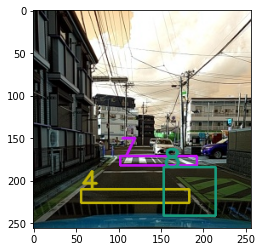

In [ ]:
a = '/content/drive/MyDrive/road/data/images/validation/Chiba_20170925144355.jpg'
b = a.replace('images', 'annotations')
b = b.replace('jpg', 'xml')
image = draw_boxes(a, b)
plt.imshow(image)

In [ ]:

# training
def train(epochs, model, train_dataset, val_dataset, steps_per_epoch_train, steps_per_epoch_val, train_name = 'train'):
    '''
    Train YOLO model for n epochs.
    Eval loss on training and validation dataset.
    Log training loss and validation loss for tensorboard.
    Save best weights during training (according to validation loss).

    Parameters
    ----------
    - epochs : integer, number of epochs to train the model.
    - model : YOLO model.
    - train_dataset : YOLO ground truth and image generator from training dataset.
    - val_dataset : YOLO ground truth and image generator from validation dataset.
    - steps_per_epoch_train : integer, number of batch to complete one epoch for train_dataset.
    - steps_per_epoch_val : integer, number of batch to complete one epoch for val_dataset.
    - train_name : string, training name used to log loss and save weights.
    
    Notes :
    - train_dataset and val_dataset generate YOLO ground truth tensors : detector_mask,
      matching_true_boxes, class_one_hot, true_boxes_grid. Shape of these tensors (batch size, tensor shape).
    - steps per epoch = number of images in dataset // batch size of dataset
    
    Returns
    -------
    - loss history : [train_loss_history, val_loss_history] : list of average loss for each epoch.
    '''
    num_epochs = epochs
    steps_per_epoch_train = steps_per_epoch_train
    steps_per_epoch_val = steps_per_epoch_val
    train_loss_history = []
    val_loss_history = []
    best_val_loss = 1e6
    
    # optimizer
    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-5, beta_1=0.9, beta_2=0.999, epsilon=1e-08)
    
    # log (tensorboard)
    summary_writer = tf.summary.create_file_writer(os.path.join('logs/', train_name), flush_millis=20000)
    summary_writer.set_as_default()
    
    # training
    for epoch in range(num_epochs):
        epoch_loss = []
        epoch_val_loss = []
        epoch_val_sub_loss = []
        print('\nEpoch {} :'.format(epoch))
        # train
        for batch_idx in progressbar.progressbar(range(steps_per_epoch_train)):
            img, detector_mask, matching_true_boxes, class_one_hot, true_boxes =  next(train_dataset)
            loss, _, grads = grad(model, img, detector_mask, matching_true_boxes, class_one_hot, true_boxes)
            optimizer.apply_gradients(zip(grads, model.trainable_variables))
            epoch_loss.append(loss)
        # val
        for batch_idx in progressbar.progressbar(range(steps_per_epoch_val)):
            img, detector_mask, matching_true_boxes, class_one_hot, true_boxes =  next(val_dataset)
            loss, sub_loss, grads = grad(model, img, detector_mask, matching_true_boxes, class_one_hot, true_boxes, training=False)
            epoch_val_loss.append(loss)
            epoch_val_sub_loss.append(sub_loss)
            
        loss_avg = np.mean(np.array(epoch_loss))
        val_loss_avg = np.mean(np.array(epoch_val_loss))
        sub_loss_avg = np.mean(np.array(epoch_val_sub_loss), axis=0)
        train_loss_history.append(loss_avg)
        val_loss_history.append(val_loss_avg)
        
        # save
        if val_loss_avg < best_val_loss:
            save_best_weights(model, train_name, val_loss_avg)
            best_val_loss = val_loss_avg
        
        print(' loss = {:.4f}, val_loss = {:.4f} (conf={:.4f}, class={:.4f}, coords={:.4f})'.format(
            loss_avg, val_loss_avg, sub_loss_avg[0], sub_loss_avg[1], sub_loss_avg[2]))


        score_threshold = 0.35
        iou_threshold = 0.3
        imgs = np.zeros((4,IMAGE_H, IMAGE_W, 3), dtype=np.uint8)
        imgs_treu = np.zeros((4,IMAGE_H, IMAGE_W, 3), dtype=np.uint8)
        img_val = '/content/drive/MyDrive/road/data/images/validation/Adachi_20170906150707.jpg'
        img_pred = yolo.display_yolo(img_val, model, score_threshold, iou_threshold)
        imgs[0,:,:,:] = img_pred.astype(np.uint8)
        b = img_val.replace('images', 'annotations')
        b = b.replace('jpg', 'xml')
        image = draw_boxes(img_val, b)
        imgs_treu[0,:,:,:] = image.astype(np.uint8)

        img_val = '/content/drive/MyDrive/road/data/images/validation/Adachi_20170908104233.jpg'
        img_pred = yolo.display_yolo(img_val, model, score_threshold,iou_threshold)
        imgs[1,:,:,:] = img_pred.astype(np.uint8)
        b = img_val.replace('images', 'annotations')
        b = b.replace('jpg', 'xml')
        image = draw_boxes(img_val, b)
        imgs_treu[1,:,:,:] = image.astype(np.uint8)
        img_val = '/content/drive/MyDrive/road/data/images/validation/Adachi_20170912143021.jpg'
        img_pred = yolo.display_yolo(img_val, model, score_threshold, iou_threshold)
        imgs[2,:,:,:] = img_pred.astype(np.uint8)
        b = img_val.replace('images', 'annotations')
        b = b.replace('jpg', 'xml')
        image = draw_boxes(img_val, b)
        imgs_treu[2,:,:,:] = image.astype(np.uint8)
        img_val = '/content/drive/MyDrive/road/data/images/validation/Chiba_20170925144355.jpg'
        img_pred = yolo.display_yolo(img_val, model, score_threshold, iou_threshold)
        imgs[3,:,:,:] = img_pred.astype(np.uint8)
        b = img_val.replace('images', 'annotations')
        b = b.replace('jpg', 'xml')
        image = draw_boxes(img_val, b)
        imgs_treu[3,:,:,:] = image.astype(np.uint8)
        
        # log
        log_loss(loss_avg, val_loss_avg, epoch, imgs, imgs_treu)
        
    return [train_loss_history, val_loss_history]

In [ ]:
# ngrok for TensorBoard
!wget https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
!unzip -o ngrok-stable-linux-amd64.zip

--2021-12-26 12:35:57--  https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
Resolving bin.equinox.io (bin.equinox.io)... 18.205.222.128, 54.237.133.81, 52.202.168.65, ...
Connecting to bin.equinox.io (bin.equinox.io)|18.205.222.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13832437 (13M) [application/octet-stream]
Saving to: ‘ngrok-stable-linux-amd64.zip.1’

ngrok-stable-linux- 100%[===================>]  13.19M  5.54MB/s    in 2.4s    

2021-12-26 12:35:59 (5.54 MB/s) - ‘ngrok-stable-linux-amd64.zip.1’ saved [13832437/13832437]

Archive:  ngrok-stable-linux-amd64.zip
  inflating: ngrok                   


In [ ]:
!./ngrok authtoken 22EEKxTCcQY33bOLvo6grDIoXaf_89DPHt3Tt1WbLGGB28kbP

Authtoken saved to configuration file: /root/.ngrok2/ngrok.yml


In [ ]:
!mkdir /content/drive/MyDrive/road/model1

In [ ]:
#the logs that are created while training 
LOG_DIR = "./logs/train0"
get_ipython().system_raw(
    'tensorboard --logdir {} --host 0.0.0.0 --port 6006 &'
    .format(LOG_DIR)
)

get_ipython().system_raw('./ngrok http 6006 &')
#The link to tensorboard.
#works after the training starts.
!curl -s http://localhost:4040/api/tunnels | python3 -c \
    "import sys, json; print(json.load(sys.stdin)['tunnels'][0]['public_url'])"

https://e0e5-34-136-178-27.ngrok.io


In [ ]:
train_name = 'train0'
train_loss_history, val_loss_history = train(EPOCHS, 
                                             model, 
                                             train_gen, 
                                             val_gen, 
                                             steps_per_epoch_train=steps_per_epoch_train, 
                                             steps_per_epoch_val=steps_per_epoch_val, 
                                             train_name = train_name)

N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Epoch 0 :


100% (650 of 650) |######################| Elapsed Time: 0:04:13 Time:  0:04:13
100% (162 of 162) |######################| Elapsed Time: 0:00:53 Time:  0:00:53


 loss = 34.4091, val_loss = 16.2383 (conf=0.3014, class=1.9346, coords=14.0024)


N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Epoch 1 :


100% (650 of 650) |######################| Elapsed Time: 0:04:01 Time:  0:04:01
100% (162 of 162) |######################| Elapsed Time: 0:00:52 Time:  0:00:52


 loss = 9.1410, val_loss = 7.6879 (conf=0.1991, class=1.6502, coords=5.8386)


N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Epoch 2 :


100% (650 of 650) |######################| Elapsed Time: 0:04:01 Time:  0:04:01
100% (162 of 162) |######################| Elapsed Time: 0:00:53 Time:  0:00:53


 loss = 5.1598, val_loss = 5.7777 (conf=0.1558, class=1.5020, coords=4.1199)


N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Epoch 3 :


100% (650 of 650) |######################| Elapsed Time: 0:04:04 Time:  0:04:04
100% (162 of 162) |######################| Elapsed Time: 0:00:53 Time:  0:00:53


 loss = 4.0722, val_loss = 4.5322 (conf=0.1340, class=1.4025, coords=2.9957)


N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Epoch 4 :


100% (650 of 650) |######################| Elapsed Time: 0:04:04 Time:  0:04:04
100% (162 of 162) |######################| Elapsed Time: 0:00:53 Time:  0:00:53


 loss = 3.7498, val_loss = 3.7394 (conf=0.1229, class=1.3237, coords=2.2928)


N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Epoch 5 :


100% (650 of 650) |######################| Elapsed Time: 0:04:04 Time:  0:04:04
100% (162 of 162) |######################| Elapsed Time: 0:00:53 Time:  0:00:53


 loss = 3.4693, val_loss = 3.2410 (conf=0.1175, class=1.2623, coords=1.8612)


N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Epoch 6 :


100% (650 of 650) |######################| Elapsed Time: 0:04:03 Time:  0:04:03
100% (162 of 162) |######################| Elapsed Time: 0:00:52 Time:  0:00:52


 loss = 2.7936, val_loss = 2.9785 (conf=0.1123, class=1.2144, coords=1.6518)


N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Epoch 7 :


100% (650 of 650) |######################| Elapsed Time: 0:03:59 Time:  0:03:59
100% (162 of 162) |######################| Elapsed Time: 0:00:52 Time:  0:00:52


 loss = 2.5753, val_loss = 2.7911 (conf=0.1094, class=1.1794, coords=1.5024)


N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Epoch 8 :


100% (650 of 650) |######################| Elapsed Time: 0:04:01 Time:  0:04:01
100% (162 of 162) |######################| Elapsed Time: 0:00:52 Time:  0:00:52


 loss = 2.3591, val_loss = 2.6589 (conf=0.1083, class=1.1431, coords=1.4076)


N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Epoch 9 :


100% (650 of 650) |######################| Elapsed Time: 0:03:59 Time:  0:03:59
100% (162 of 162) |######################| Elapsed Time: 0:00:52 Time:  0:00:52


 loss = 2.2305, val_loss = 2.5292 (conf=0.1065, class=1.1143, coords=1.3083)


N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Epoch 10 :


100% (650 of 650) |######################| Elapsed Time: 0:03:57 Time:  0:03:57
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51


 loss = 2.1262, val_loss = 2.3497 (conf=0.1067, class=1.0883, coords=1.1547)


N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Epoch 11 :


100% (650 of 650) |######################| Elapsed Time: 0:03:57 Time:  0:03:57
100% (162 of 162) |######################| Elapsed Time: 0:00:52 Time:  0:00:52


 loss = 2.0522, val_loss = 2.1973 (conf=0.1056, class=1.0694, coords=1.0223)


N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Epoch 12 :


100% (650 of 650) |######################| Elapsed Time: 0:03:58 Time:  0:03:58
100% (162 of 162) |######################| Elapsed Time: 0:00:53 Time:  0:00:53


 loss = 1.9438, val_loss = 2.0391 (conf=0.1067, class=1.0530, coords=0.8794)


N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Epoch 13 :


100% (650 of 650) |######################| Elapsed Time: 0:03:59 Time:  0:03:59
100% (162 of 162) |######################| Elapsed Time: 0:00:52 Time:  0:00:52


 loss = 1.8447, val_loss = 1.9324 (conf=0.1071, class=1.0375, coords=0.7878)


N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Epoch 14 :


100% (650 of 650) |######################| Elapsed Time: 0:03:59 Time:  0:03:59
100% (162 of 162) |######################| Elapsed Time: 0:00:52 Time:  0:00:52


 loss = 1.7850, val_loss = 1.8045 (conf=0.1063, class=1.0240, coords=0.6742)


N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Epoch 15 :


100% (650 of 650) |######################| Elapsed Time: 0:04:00 Time:  0:04:00
100% (162 of 162) |######################| Elapsed Time: 0:00:53 Time:  0:00:53


 loss = 1.6500, val_loss = 1.6981 (conf=0.1079, class=1.0060, coords=0.5842)


N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Epoch 16 :


100% (650 of 650) |######################| Elapsed Time: 0:04:00 Time:  0:04:00
100% (162 of 162) |######################| Elapsed Time: 0:00:52 Time:  0:00:52


 loss = 1.5888, val_loss = 1.5885 (conf=0.1091, class=0.9922, coords=0.4872)


N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Epoch 17 :


100% (650 of 650) |######################| Elapsed Time: 0:04:01 Time:  0:04:01
100% (162 of 162) |######################| Elapsed Time: 0:00:52 Time:  0:00:52


 loss = 1.5187, val_loss = 1.5071 (conf=0.1101, class=0.9709, coords=0.4261)


N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Epoch 18 :


100% (650 of 650) |######################| Elapsed Time: 0:04:02 Time:  0:04:02
100% (162 of 162) |######################| Elapsed Time: 0:00:52 Time:  0:00:52


 loss = 1.4471, val_loss = 1.4292 (conf=0.1089, class=0.9385, coords=0.3819)


N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Epoch 19 :


100% (650 of 650) |######################| Elapsed Time: 0:03:59 Time:  0:03:59
100% (162 of 162) |######################| Elapsed Time: 0:28:25 Time:  0:28:25


 loss = 1.3887, val_loss = 1.3633 (conf=0.1075, class=0.8916, coords=0.3642)


N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Epoch 20 :


100% (650 of 650) |######################| Elapsed Time: 0:04:02 Time:  0:04:02
100% (162 of 162) |######################| Elapsed Time: 0:00:52 Time:  0:00:52


 loss = 1.3269, val_loss = 1.3016 (conf=0.1078, class=0.8508, coords=0.3430)


N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Epoch 21 :


 30% (201 of 650) |######                | Elapsed Time: 0:01:16 ETA:   0:02:41

# Predict

In [ ]:
def predict_test(model, test_dir_images, save_dir, score_threshold=0.4, iou_threshold=0.5):
  images_path = glob.glob(os.path.join(test_dir_images, '*.jpg'))
  for i in progressbar.progressbar(range(len(images_path))):
    img = images_path[i]
    name = img.split('/')[-1]
    img_pred = yolo.display_yolo(img, model, score_threshold, iou_threshold)
    cv2.imwrite(os.path.join(save_dir, 'p_'+name), img_pred.astype(np.uint8))

In [ ]:
!mkdir /content/drive/MyDrive/road/preds_test

In [ ]:
test_dir_images = '/content/drive/MyDrive/road/data/images/test'
save_dir = '/content/drive/MyDrive/road/preds_test'
predict_test(model, test_dir_images, save_dir, score_threshold=0.35, iou_threshold=0.3)

100% (796 of 796) |######################| Elapsed Time: 0:01:54 Time:  0:01:54


## predict a video

In [ ]:
video_path = '/content/drive/MyDrive/road/IMG_6913.MP4'
w = 256

In [ ]:
def predict_test(model, video_path, save_dir, score_threshold=0.35, iou_threshold=0.3, w= 256):
  cap = cv2.VideoCapture(video_path)
  fps = cap.get(cv2.CAP_PROP_FPS)
  out = cv2.VideoWriter(os.path.join(save_dir, 'output.mp4'), cv2.VideoWriter_fourcc(*'MP4V'), fps, (w,w))
  while(cap.isOpened()):
    # Capture frame-by-frame
    ret, frame = cap.read()
    # if frame is read correctly ret is True
    if not ret:
      print("Done!")
      break
      
    img = cv2.resize(frame, (w, w), interpolation = cv2.INTER_AREA)
    img_pred = yolo.display_yolo("", model, score_threshold, iou_threshold, img=img)
    out.write(img_pred)
  out.release()

In [ ]:
predict_test(model, video_path, save_dir='/content/drive/MyDrive/road', score_threshold=0.5, iou_threshold=0.3, w = w)

Done!


## NMS + ROI

In [ ]:
def predict_boxes(file, model, score_threshold, iou_threshold, disp=False, img = None, num_boxes = 8):
  '''
  Display predictions from YOLO model.

  Parameters
  ----------
  - file : string list : list of images path.
  - model : YOLO model.
  - score_threshold : threshold used for filtering predicted bounding boxes.
  - iou_threshold : threshold used for non max suppression.
  '''
  # load image
  if img is None:
    image = cv2.imread(file)
    image_copy = image.copy()
  else:
    image = img.copy()
    image_copy = img.copy()

  #input_image = image[:,:,::-1]
  input_image = image / 255.
  input_image = np.expand_dims(input_image, 0)

  # prediction
  y_pred = model.predict_on_batch(input_image)

  # post prediction process
  # grid coords tensor
  coord_x = tf.cast(tf.reshape(tf.tile(tf.range(GRID_W), [GRID_H]), (1, GRID_H, GRID_W, 1, 1)), tf.float32)
  coord_y = tf.transpose(coord_x, (0,2,1,3,4))
  coords = tf.tile(tf.concat([coord_x,coord_y], -1), [TRAIN_BATCH_SIZE, 1, 1, 5, 1])
  dims = K.cast_to_floatx(K.int_shape(y_pred)[1:3])
  dims = K.reshape(dims,(1,1,1,1,2))
  # anchors tensor
  anchors = np.array(ANCHORS)
  anchors = anchors.reshape(len(anchors) // 2, 2)
  # pred_xy and pred_wh shape (m, GRID_W, GRID_H, Anchors, 2)
  pred_xy = K.sigmoid(y_pred[:,:,:,:,0:2])
  pred_xy = (pred_xy + coords)
  pred_xy = pred_xy / dims
  pred_wh = K.exp(y_pred[:,:,:,:,2:4])
  pred_wh = (pred_wh * anchors)
  pred_wh = pred_wh / dims
  # pred_confidence
  box_conf = K.sigmoid(y_pred[:,:,:,:,4:5])  
  # pred_class
  box_class_prob = K.softmax(y_pred[:,:,:,:,5:])

  # Reshape
  pred_xy = pred_xy[0,...]
  pred_wh = pred_wh[0,...]
  box_conf = box_conf[0,...]
  box_class_prob = box_class_prob[0,...]

  # Convert box coords from x,y,w,h to x1,y1,x2,y2
  box_xy1 = pred_xy - 0.5 * pred_wh
  box_xy2 = pred_xy + 0.5 * pred_wh
  boxes = K.concatenate((box_xy1, box_xy2), axis=-1)

  # Filter boxes
  box_scores = box_conf * box_class_prob
  box_classes = K.argmax(box_scores, axis=-1) # best score index
  box_class_scores = K.max(box_scores, axis=-1) # best score
  prediction_mask = box_class_scores >= score_threshold
  boxes = tf.boolean_mask(boxes, prediction_mask)
  scores = tf.boolean_mask(box_class_scores, prediction_mask)
  classes = tf.boolean_mask(box_classes, prediction_mask)

  # Scale box to image shape
  boxes = boxes * IMAGE_H

  # Non Max Supression
  selected_idx = tf.image.non_max_suppression(boxes, scores, num_boxes, iou_threshold=iou_threshold)
  boxes = K.gather(boxes, selected_idx)
  scores = K.gather(scores, selected_idx)
  classes = K.gather(classes, selected_idx)
  return boxes, scores, classes
    
        

In [ ]:
img_val = '/content/drive/MyDrive/road/data/images/validation/Adachi_20170906150707.jpg'
boxes, scores, classes = predict_boxes(img_val, model, 0.3, 0.5,disp=False)

In [ ]:
def parse_xml(xml_path):
    '''
    Parse XML files in PASCAL VOC format.
    
    Parameters
    ----------
    - xml_path : path to xml file
    
    Returns
    -------
    - image_name, width, height, bboxes    
    '''
    
    bboxes = []
    tree = ET.parse(xml_path)
    for elem in tree.iter(): 
        if 'filename' in elem.tag:
          image_name = elem.text
        if 'width' in elem.tag:
            w = int(elem.text)
        if 'height' in elem.tag:
            h = int(elem.text)
        if 'object' in elem.tag or 'part' in elem.tag:                  
            box = np.zeros((4), dtype=np.int32)
            for attr in list(elem):
              if 'bndbox' in attr.tag:
                  for dim in list(attr):
                      if 'xmin' in dim.tag:
                          box[0] = int(round(float(dim.text)))
                      if 'ymin' in dim.tag:
                          box[1] = int(round(float(dim.text)))
                      if 'xmax' in dim.tag:
                          box[2] = int(round(float(dim.text)))
                      if 'ymax' in dim.tag:
                          box[3] = int(round(float(dim.text)))
                  bboxes.append(np.asarray(box))
            
    return image_name, w, h, bboxes    

In [ ]:
FRAME_INTERVAL = 20
NUM_BOXES = 50
roi_path = '/content/drive/MyDrive/road/roi.xml'

In [ ]:
image_name, w, h, roi   = parse_xml(roi_path)

In [ ]:
def calculate_aou(roi, bbox):
  xmin1 = roi[0]
  ymin1 = roi[1]
  xmax1 = roi[2]
  ymax1 = roi[3]
  area1 = (xmax1-xmin1)*(ymax1-ymin1)

  xmin2 = bbox[0]
  ymin2 = bbox[1]
  xmax2 = bbox[2]
  ymax2 = bbox[3]
  area2 = (xmax2-xmin2)*(ymax2-ymin2)
  
  # A common B
  xx = max(xmin1, xmin2)
  yy = max(ymin1, ymin2)
  aa = min(xmax1, xmax2)
  bb = min(ymax1, ymax2)

  # intersection BBox has the coordinates (xx,yy) (aa,bb)
  w = max(0, aa - xx)
  h = max(0, bb - yy)

  # find the intersection area
  intersection_area = w*h

  # union area of both the boxes
  union_area = area1 + area2 - intersection_area
  
  IoU = intersection_area / area2
  return IoU


In [ ]:
roi

[array([  1, 555, 704, 848], dtype=int32)]

In [ ]:
calculate_aou(roi[0], [  10, 600, 600, 700])

1.0

In [ ]:
def predict_video_with_nms_roi(model, 
                               video_path, 
                               save_dir, 
                               roi, 
                               score_threshold=0.35, 
                               iou_threshold=0.3,
                               pool_iou_threshold=0.3, 
                               roi_iou_threshold=0.8, 
                               w= 256):
  cap = cv2.VideoCapture(video_path)
  fps = cap.get(cv2.CAP_PROP_FPS)
  print(fps)
  out = cv2.VideoWriter(os.path.join(save_dir, 'output2.mp4'), cv2.VideoWriter_fourcc(*'MP4V'), fps, (w,w))
  #out = cv2.VideoWriter(os.path.join(save_dir, 'output2.avi'),cv2.VideoWriter_fourcc('M','J','P','G'), fps, (w,w))
  image_pool = np.zeros((FRAME_INTERVAL, w,w,3))
  i = 0
  first = True
  while(cap.isOpened()):
    # Capture frame-by-frame
    ret, frame = cap.read()
    # if frame is read correctly ret is True
    if not ret:
      print("Done!")
      break
    if first:
      h_, w_, c_ = frame.shape
      scale = w/h_
      print(roi)
      scale_h = w/h_
      scale_w = w/w_
      roi = roi.astype(np.float32)
      roi[0] = roi[0]*scale_w
      roi[2] = roi[2]*scale_w
      roi[1] = roi[1]*scale_h
      roi[3] = roi[3]*scale_h
      roi = roi.astype(np.int32)
      print(roi)
      first = False
    img = cv2.resize(frame, (w, w), interpolation = cv2.INTER_AREA)
    boxes, scores, classes = predict_boxes(
        '', 
        model, 
        score_threshold, 
        iou_threshold, 
        disp=False, 
        img = img,
        num_boxes = NUM_BOXES)
    if i<FRAME_INTERVAL:
      image_pool[i,:,:,:] = img
      if i==0:
        boxes_pool = boxes
        scores_pool = scores
        classes_pool = classes
      else: 
        boxes_pool = tf.concat([boxes_pool, boxes], 0)
        scores_pool = tf.concat([scores_pool, scores], 0)
        classes_pool = tf.concat([classes_pool, classes], 0)
      i+=1
    else:
      i=0

      # Non Max Supression over Frames
      selected_idx = tf.image.non_max_suppression(boxes_pool, scores_pool, NUM_BOXES, iou_threshold=pool_iou_threshold)
      boxes = K.gather(boxes_pool, selected_idx)
      boxes = boxes.numpy()
      scores = K.gather(scores_pool, selected_idx)
      scores = scores.numpy()
      classes = K.gather(classes_pool, selected_idx)
      classes = classes.numpy()

      # ROI check
      del_ids = []
      for k in range(scores.shape[0]):
        iou = calculate_aou(roi, boxes[k,:])
        if iou < roi_iou_threshold:
          del_ids.append(k)
      boxes = np.delete(boxes, del_ids,0)
      scores = np.delete(scores, del_ids,0)
      classes = np.delete(classes, del_ids,0)
      thickness = 2
      font = cv2.FONT_HERSHEY_SIMPLEX
      fontScale = 1
      colors = [(0,0, 255), (0,255, 0), (255, 0, 0), (255, 150, 50), (50, 255, 90), (90, 155, 255), (0, 0, 0), (90, 90, 165) ]
      for j in range(FRAME_INTERVAL):
        image_copy = image_pool[j,:,:,:]
        for k in range(boxes.shape[0]):
          box = boxes[k,:]
          clas = classes[k] + 1

          color = colors[clas-1]
          start_point = (box[0], box[1])
          end_point = (box[2], box[3])
          image_copy = cv2.rectangle(image_copy, start_point, end_point, color, thickness)
          image_copy = cv2.putText(image_copy, str(clas)+': {score:.3f}'.format(score=scores[k]), start_point, font, fontScale, color, thickness, cv2.LINE_AA)
          
        image_copy = image_copy.astype(np.uint8)
        out.write(image_copy)
  out.release()


In [ ]:
video_path = '/content/drive/MyDrive/road/IMG_7815.MP4'
w = 256
predict_video_with_nms_roi( model, 
                            video_path, 
                            save_dir='/content/drive/MyDrive/road', 
                            roi = roi[0], 
                            score_threshold=0.35, 
                            iou_threshold=0.3,
                            pool_iou_threshold=0.4, 
                            roi_iou_threshold=0.9, 
                            w= 256)

19.361702127659573
[  1 555 704 848]
[  0 167 212 256]
Done!


### nms+roi + connected components

------------------------------


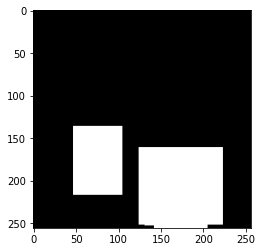

In [ ]:
boxes1 = boxes.numpy()
scores1 = scores.numpy()
classes1 = classes.numpy()
new_boxes = []
new_classes = []
new_scores = []
for cls in np.unique(classes1):
  boxes_class = boxes1[np.where(classes1==cls)]
  scores_class = boxes1[np.where(classes1==cls)]
  thresh = np.zeros((w,w), dtype=np.uint8)
  for j in range(boxes_class.shape[0]):
    x = int(boxes_class[j][0])
    y = int(boxes_class[j][1])
    a = int(boxes_class[j][2])
    b = int(boxes_class[j][3])
    thresh = cv2.rectangle(thresh, (x, y), (a,b), (255), -1)
  plt.imshow(thresh, cmap='gray')
  output = cv2.connectedComponentsWithStats(thresh, 4, cv2.CV_32S)
  (numLabels, labels, stats, centroids) = output

  
  for k in range(stats.shape[0]):
    box = stats[k,:]
    x = box[0]
    y = box[1]
    a = box[0] + box[2]
    b = box[1] + box[3]
    if not(x==0 and y==0):# if it is not background
      new_boxes.append([x,y,a,b])
      new_classes.append(cls)
      new_scores.append(np.mean(scores_class))
  print('------------------------------')
  break

In [ ]:
def predict_video_with_nms_roi(model, 
                               video_path, 
                               save_dir, 
                               roi, 
                               score_threshold=0.35, 
                               iou_threshold=0.3,
                               pool_iou_threshold=0.3, 
                               roi_iou_threshold=0.8, 
                               w= 256):
  cap = cv2.VideoCapture(video_path)
  fps = cap.get(cv2.CAP_PROP_FPS)
  print(fps)
  out = cv2.VideoWriter(os.path.join(save_dir, 'output3.mp4'), cv2.VideoWriter_fourcc(*'MP4V'), fps, (w,w))
  image_pool = np.zeros((FRAME_INTERVAL, w,w,3))
  width = cap.get(cv2.CAP_PROP_FRAME_WIDTH )
  height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT )
  image_pool_real = np.zeros((FRAME_INTERVAL, int(height),int(width),3))
  out2 = cv2.VideoWriter(os.path.join(save_dir, 'output3_real_size.mp4'), cv2.VideoWriter_fourcc(*'MP4V'), fps, (int(width),int(height)))

  i = 0
  first = True
  while(cap.isOpened()):
    # Capture frame-by-frame
    ret, frame = cap.read()
    # if frame is read correctly ret is True
    if not ret:
      print("Done!")
      break
    if first:
      h_, w_, c_ = frame.shape
      scale_h = w/h_
      scale_w = w/w_
      print(roi)
      roi_real = roi.copy()
      roi_real = roi_real.astype(np.int32)
      roi = roi.astype(np.float32)
      roi[0] = roi[0]*scale_w
      roi[2] = roi[2]*scale_w
      roi[1] = roi[1]*scale_h
      roi[3] = roi[3]*scale_h
      roi = roi.astype(np.int32)
      print(roi)
      first = False
    img = cv2.resize(frame, (w, w), interpolation = cv2.INTER_AREA)
    boxes, scores, classes = predict_boxes(
        '', 
        model, 
        score_threshold, 
        iou_threshold, 
        disp=False, 
        img = img,
        num_boxes = NUM_BOXES)
    if i<FRAME_INTERVAL:
      image_pool_real[i,:,:,:] = frame
      image_pool[i,:,:,:] = img
      if i==0:
        boxes_pool = boxes
        scores_pool = scores
        classes_pool = classes
      else: 
        boxes_pool = tf.concat([boxes_pool, boxes], 0)
        scores_pool = tf.concat([scores_pool, scores], 0)
        classes_pool = tf.concat([classes_pool, classes], 0)
      i+=1
    else:
      i=0

      # Non Max Supression over Frames
      selected_idx = tf.image.non_max_suppression(boxes_pool, scores_pool, NUM_BOXES, iou_threshold=pool_iou_threshold)
      boxes = K.gather(boxes_pool, selected_idx)
      boxes = boxes.numpy()
      scores = K.gather(scores_pool, selected_idx)
      scores = scores.numpy()
      classes = K.gather(classes_pool, selected_idx)
      classes = classes.numpy()

      # ROI check
      del_ids = []
      for k in range(scores.shape[0]):
        iou = calculate_aou(roi, boxes[k,:])
        if iou < roi_iou_threshold:
          del_ids.append(k)
      boxes = np.delete(boxes, del_ids,0)
      scores = np.delete(scores, del_ids,0)
      classes = np.delete(classes, del_ids,0)

      new_boxes = []
      new_classes = []
      new_scores = []
      for cls in np.unique(classes):
        boxes_class = boxes[np.where(classes==cls)]
        scores_class = scores[np.where(classes==cls)]
        thresh = np.zeros((w,w), dtype=np.uint8)
        for j in range(boxes_class.shape[0]):
          x = int(boxes_class[j][0])
          y = int(boxes_class[j][1])
          a = int(boxes_class[j][2])
          b = int(boxes_class[j][3])
          thresh = cv2.rectangle(thresh, (x, y), (a,b), (255), -1)
        #plt.imshow(thresh, cmap='gray')
        output = cv2.connectedComponentsWithStats(thresh, 4, cv2.CV_32S)
        (numLabels, labels, stats, centroids) = output
        for k in range(stats.shape[0]):
          box = stats[k,:]
          x = box[0]
          y = box[1]
          a = box[0] + box[2]
          b = box[1] + box[3]
          if not(x==0 and y==0):# if it is not background
            new_boxes.append([x,y,a,b])
            new_classes.append(cls)
            new_scores.append(np.mean(scores_class))
      boxes = np.array(new_boxes)
      classes = new_classes
      scores = new_scores

      
      
      thickness = 2
      font = cv2.FONT_HERSHEY_SIMPLEX
      fontScale = 1
      colors = [(0,0, 255), (0,255, 0), (255, 0, 0), (255, 150, 50), (50, 255, 90), (90, 155, 255), (0, 0, 0), (90, 90, 165) ]
      for j in range(FRAME_INTERVAL):
        image_copy = image_pool[j,:,:,:]
        mask = image_copy[roi[1]:roi[3]-1, roi[0]:roi[2]-1,:]
        white_rect = np.ones(mask.shape, dtype=image_copy.dtype) * 255
        white_rect[:,:,1:] = 0
        mask = cv2.addWeighted(mask, 0.7, white_rect, 0.3, 1.0)
        image_copy[roi[1]:roi[3]-1, roi[0]:roi[2]-1,:] = mask

        image_copy_real = image_pool_real[j,:,:,:]
        mask = image_copy_real[roi_real[1]:roi_real[3]-1, roi_real[0]:roi_real[2]-1,:]
        white_rect = np.ones(mask.shape, dtype=image_copy_real.dtype) * 255
        white_rect[:,:,1:] = 0
        mask = cv2.addWeighted(mask, 0.7, white_rect, 0.3, 1.0)
        image_copy_real[roi_real[1]:roi_real[3]-1, roi_real[0]:roi_real[2]-1,:] = mask
        for k in range(boxes.shape[0]):
          box = boxes[k,:]
          clas = classes[k] + 1

          color = colors[clas-1]
          start_point = (box[0], box[1])
          end_point = (box[2], box[3])
          image_copy = cv2.rectangle(image_copy, start_point, end_point, color, thickness)
          image_copy = cv2.putText(image_copy, str(clas)+': {score:.3f}'.format(score=scores[k]), start_point, font, fontScale, color, thickness, cv2.LINE_AA)

          start_point = (int(box[0]*1./scale_w), int(box[1]*1./scale_h))
          end_point = (int(box[2]*1./scale_w), int(box[3]*1./scale_h))
          image_copy_real = cv2.rectangle(image_copy_real, start_point, end_point, color, thickness)
          image_copy_real = cv2.putText(image_copy_real, str(clas)+': {score:.3f}'.format(score=scores[k]), start_point, font, fontScale, color, thickness, cv2.LINE_AA)
        

        image_copy = image_copy.astype(np.uint8)
        out.write(image_copy)
        image_copy_real = image_copy_real.astype(np.uint8)
        out2.write(image_copy_real)
  out.release()
  out2.release()


In [ ]:
FRAME_INTERVAL = 20
NUM_BOXES = 50
roi_path = '/content/drive/MyDrive/road/roi.xml'

In [ ]:
video_path = '/content/drive/MyDrive/road/IMG_7815.MP4'
w = 256
predict_video_with_nms_roi( model, 
                            video_path, 
                            save_dir='/content/drive/MyDrive/road', 
                            roi = roi[0], 
                            score_threshold=0.3, 
                            iou_threshold=0.5,
                            pool_iou_threshold=0.5, 
                            roi_iou_threshold=0.8, 
                            w= 256)

19.361702127659573
[  1 555 704 848]
[  0 167 256 256]
Done!


# losses

In [ ]:
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 0 :
100% (650 of 650) |######################| Elapsed Time: 0:04:10 Time:  0:04:10
100% (162 of 162) |######################| Elapsed Time: 0:00:53 Time:  0:00:53
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 31.5911, val_loss = 46.3332 (conf=0.8858, class=2.5502, coords=42.8973)

Epoch 1 :
100% (650 of 650) |######################| Elapsed Time: 0:04:08 Time:  0:04:08
100% (162 of 162) |######################| Elapsed Time: 0:00:53 Time:  0:00:53
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 14.7262, val_loss = 27.7294 (conf=0.5981, class=2.2289, coords=24.9025)

Epoch 2 :
100% (650 of 650) |######################| Elapsed Time: 0:04:07 Time:  0:04:07
100% (162 of 162) |######################| Elapsed Time: 0:00:53 Time:  0:00:53
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 7.0629, val_loss = 11.3086 (conf=0.4394, class=2.0544, coords=8.8148)

Epoch 3 :
100% (650 of 650) |######################| Elapsed Time: 0:04:05 Time:  0:04:05
100% (162 of 162) |######################| Elapsed Time: 0:00:53 Time:  0:00:53
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 5.7508, val_loss = 8.9594 (conf=0.3538, class=1.9377, coords=6.6679)

Epoch 4 :
100% (650 of 650) |######################| Elapsed Time: 0:04:06 Time:  0:04:06
100% (162 of 162) |######################| Elapsed Time: 0:00:53 Time:  0:00:53
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 4.5876, val_loss = 5.9065 (conf=0.3011, class=1.8421, coords=3.7634)

Epoch 5 :
100% (650 of 650) |######################| Elapsed Time: 0:04:05 Time:  0:04:05
100% (162 of 162) |######################| Elapsed Time: 0:00:53 Time:  0:00:53
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 4.3845, val_loss = 4.4704 (conf=0.2737, class=1.7684, coords=2.4282)

Epoch 6 :
100% (650 of 650) |######################| Elapsed Time: 0:04:03 Time:  0:04:03
100% (162 of 162) |######################| Elapsed Time: 0:00:53 Time:  0:00:53
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 3.7374, val_loss = 4.1106 (conf=0.2596, class=1.7090, coords=2.1420)

Epoch 7 :
100% (650 of 650) |######################| Elapsed Time: 0:04:03 Time:  0:04:03
100% (162 of 162) |######################| Elapsed Time: 0:00:53 Time:  0:00:53
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 3.4548, val_loss = 3.8552 (conf=0.2503, class=1.6699, coords=1.9349)

Epoch 8 :
100% (650 of 650) |######################| Elapsed Time: 0:04:04 Time:  0:04:04
100% (162 of 162) |######################| Elapsed Time: 0:00:53 Time:  0:00:53
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 3.2444, val_loss = 3.6019 (conf=0.2439, class=1.6233, coords=1.7347)

Epoch 9 :
100% (650 of 650) |######################| Elapsed Time: 0:04:03 Time:  0:04:03
100% (162 of 162) |######################| Elapsed Time: 0:00:53 Time:  0:00:53
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 3.0850, val_loss = 3.3577 (conf=0.2418, class=1.5926, coords=1.5232)

Epoch 10 :
100% (650 of 650) |######################| Elapsed Time: 0:04:04 Time:  0:04:04
100% (162 of 162) |######################| Elapsed Time: 0:00:53 Time:  0:00:53
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 3.4572, val_loss = 3.0515 (conf=0.2377, class=1.5734, coords=1.2403)

Epoch 11 :
100% (650 of 650) |######################| Elapsed Time: 0:04:02 Time:  0:04:02
100% (162 of 162) |######################| Elapsed Time: 0:00:53 Time:  0:00:53
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 7.2010, val_loss = 2.9617 (conf=0.2424, class=1.5473, coords=1.1719)

Epoch 12 :
100% (650 of 650) |######################| Elapsed Time: 0:04:00 Time:  0:04:00
100% (162 of 162) |######################| Elapsed Time: 0:00:52 Time:  0:00:52
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 3.2729, val_loss = 2.8812 (conf=0.2422, class=1.5190, coords=1.1200)

Epoch 13 :
100% (650 of 650) |######################| Elapsed Time: 0:04:01 Time:  0:04:01
100% (162 of 162) |######################| Elapsed Time: 0:00:52 Time:  0:00:52
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 2.7087, val_loss = 2.8044 (conf=0.2418, class=1.4917, coords=1.0709)

Epoch 14 :
100% (650 of 650) |######################| Elapsed Time: 0:04:00 Time:  0:04:00
100% (162 of 162) |######################| Elapsed Time: 0:00:52 Time:  0:00:52
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 2.6516, val_loss = 2.7654 (conf=0.2385, class=1.4715, coords=1.0554)

Epoch 15 :
100% (650 of 650) |######################| Elapsed Time: 0:04:02 Time:  0:04:02
100% (162 of 162) |######################| Elapsed Time: 0:00:52 Time:  0:00:52
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 2.6187, val_loss = 2.6983 (conf=0.2383, class=1.4495, coords=1.0105)

Epoch 16 :
100% (650 of 650) |######################| Elapsed Time: 0:04:02 Time:  0:04:02
100% (162 of 162) |######################| Elapsed Time: 0:00:53 Time:  0:00:53
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 2.5579, val_loss = 2.6756 (conf=0.2380, class=1.4292, coords=1.0083)

Epoch 17 :
100% (650 of 650) |######################| Elapsed Time: 0:04:01 Time:  0:04:01
100% (162 of 162) |######################| Elapsed Time: 0:00:52 Time:  0:00:52
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 2.5271, val_loss = 2.5935 (conf=0.2373, class=1.4119, coords=0.9444)

Epoch 18 :
100% (650 of 650) |######################| Elapsed Time: 0:04:01 Time:  0:04:01
100% (162 of 162) |######################| Elapsed Time: 0:00:52 Time:  0:00:52
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 2.5025, val_loss = 2.5432 (conf=0.2361, class=1.3925, coords=0.9146)

Epoch 19 :
100% (650 of 650) |######################| Elapsed Time: 0:04:01 Time:  0:04:01
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 2.4317, val_loss = 2.4910 (conf=0.2324, class=1.3804, coords=0.8783)

Epoch 20 :
100% (650 of 650) |######################| Elapsed Time: 0:03:55 Time:  0:03:55
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 2.3845, val_loss = 2.4486 (conf=0.2293, class=1.3637, coords=0.8556)

Epoch 21 :
100% (650 of 650) |######################| Elapsed Time: 0:03:55 Time:  0:03:55
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 2.3189, val_loss = 2.3804 (conf=0.2270, class=1.3469, coords=0.8065)

Epoch 22 :
100% (650 of 650) |######################| Elapsed Time: 0:03:55 Time:  0:03:55
100% (162 of 162) |######################| Elapsed Time: 0:01:33 Time:  0:01:33
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 2.2908, val_loss = 2.3228 (conf=0.2266, class=1.3344, coords=0.7618)

Epoch 23 :
100% (650 of 650) |######################| Elapsed Time: 0:03:56 Time:  0:03:56
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 2.2416, val_loss = 2.2726 (conf=0.2215, class=1.3177, coords=0.7335)

Epoch 24 :
100% (650 of 650) |######################| Elapsed Time: 0:03:55 Time:  0:03:55
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 2.2064, val_loss = 2.2336 (conf=0.2166, class=1.3068, coords=0.7101)

Epoch 25 :
100% (650 of 650) |######################| Elapsed Time: 0:03:54 Time:  0:03:54
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 2.1487, val_loss = 2.1664 (conf=0.2135, class=1.2909, coords=0.6620)

Epoch 26 :
100% (650 of 650) |######################| Elapsed Time: 0:03:53 Time:  0:03:53
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 2.1089, val_loss = 2.0958 (conf=0.2080, class=1.2704, coords=0.6174)

Epoch 27 :
100% (650 of 650) |######################| Elapsed Time: 0:03:52 Time:  0:03:52
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 2.0581, val_loss = 2.0442 (conf=0.2046, class=1.2526, coords=0.5869)

Epoch 28 :
100% (650 of 650) |######################| Elapsed Time: 0:03:53 Time:  0:03:53
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:-- loss = 1.9873, val_loss = 1.9936 (conf=0.2017, class=1.2322, coords=0.5597)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 0 :
100% (650 of 650) |######################| Elapsed Time: 0:04:08 Time:  0:04:08
100% (162 of 162) |######################| Elapsed Time: 0:00:55 Time:  0:00:55
 loss = 1.4790, val_loss = 1.4588 (conf=0.1663, class=0.9400, coords=0.3525)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 1 :
100% (650 of 650) |######################| Elapsed Time: 0:04:07 Time:  0:04:07
100% (162 of 162) |######################| Elapsed Time: 0:00:54 Time:  0:00:54
 loss = 1.4031, val_loss = 1.4053 (conf=0.1604, class=0.9011, coords=0.3438)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 2 :
100% (650 of 650) |######################| Elapsed Time: 0:04:06 Time:  0:04:06
100% (162 of 162) |######################| Elapsed Time: 0:00:54 Time:  0:00:54
 loss = 1.3648, val_loss = 1.3692 (conf=0.1585, class=0.8753, coords=0.3353)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--

N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 0 :
100% (650 of 650) |######################| Elapsed Time: 0:04:10 Time:  0:04:10
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 1.7665, val_loss = 1.7172 (conf=0.1856, class=1.1100, coords=0.4215)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 1 :
100% (650 of 650) |######################| Elapsed Time: 0:03:52 Time:  0:03:52
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 1.6622, val_loss = 1.6280 (conf=0.1800, class=1.0517, coords=0.3963)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 2 :
100% (650 of 650) |######################| Elapsed Time: 0:03:54 Time:  0:03:54
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 1.5698, val_loss = 1.5553 (conf=0.1772, class=0.9984, coords=0.3797)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 3 :
100% (650 of 650) |######################| Elapsed Time: 0:03:54 Time:  0:03:54
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 1.5080, val_loss = 1.4987 (conf=0.1729, class=0.9621, coords=0.3637)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 4 :
100% (650 of 650) |######################| Elapsed Time: 0:03:53 Time:  0:03:53
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 1.4357, val_loss = 1.4436 (conf=0.1677, class=0.9183, coords=0.3576)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 5 :
100% (650 of 650) |######################| Elapsed Time: 0:03:53 Time:  0:03:53
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 1.3839, val_loss = 1.3921 (conf=0.1617, class=0.8838, coords=0.3466)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 6 :
100% (650 of 650) |######################| Elapsed Time: 0:03:53 Time:  0:03:53
100% (162 of 162) |######################| Elapsed Time: 0:00:50 Time:  0:00:50
 loss = 1.3574, val_loss = 1.3614 (conf=0.1584, class=0.8646, coords=0.3385)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 7 :
100% (650 of 650) |######################| Elapsed Time: 0:03:52 Time:  0:03:52
100% (162 of 162) |######################| Elapsed Time: 0:00:50 Time:  0:00:50
 loss = 1.3084, val_loss = 1.3436 (conf=0.1576, class=0.8500, coords=0.3361)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 8 :
100% (650 of 650) |######################| Elapsed Time: 0:03:52 Time:  0:03:52
100% (162 of 162) |######################| Elapsed Time: 0:00:50 Time:  0:00:50
 loss = 1.2574, val_loss = 1.3165 (conf=0.1543, class=0.8296, coords=0.3326)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 9 :
100% (650 of 650) |######################| Elapsed Time: 0:03:53 Time:  0:03:53
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 1.2221, val_loss = 1.2930 (conf=0.1554, class=0.8131, coords=0.3245)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 10 :
100% (650 of 650) |######################| Elapsed Time: 0:03:53 Time:  0:03:53
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 1.1986, val_loss = 1.2732 (conf=0.1527, class=0.8014, coords=0.3191)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 11 :
100% (650 of 650) |######################| Elapsed Time: 0:03:53 Time:  0:03:53
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 1.1634, val_loss = 1.2490 (conf=0.1525, class=0.7815, coords=0.3151)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 12 :
100% (650 of 650) |######################| Elapsed Time: 0:03:54 Time:  0:03:54
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 1.1340, val_loss = 1.2317 (conf=0.1504, class=0.7702, coords=0.3110)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 13 :
100% (650 of 650) |######################| Elapsed Time: 0:03:53 Time:  0:03:53
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 1.0986, val_loss = 1.2159 (conf=0.1482, class=0.7600, coords=0.3077)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 14 :
100% (650 of 650) |######################| Elapsed Time: 0:03:53 Time:  0:03:53
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 1.0775, val_loss = 1.1991 (conf=0.1485, class=0.7439, coords=0.3067)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 15 :
100% (650 of 650) |######################| Elapsed Time: 0:03:53 Time:  0:03:53
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 1.0361, val_loss = 1.2014 (conf=0.1479, class=0.7378, coords=0.3158)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 16 :
100% (650 of 650) |######################| Elapsed Time: 0:03:52 Time:  0:03:52
100% (162 of 162) |######################| Elapsed Time: 0:00:50 Time:  0:00:50
 loss = 1.0158, val_loss = 1.1816 (conf=0.1487, class=0.7236, coords=0.3093)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 17 :
100% (650 of 650) |######################| Elapsed Time: 0:03:53 Time:  0:03:53
100% (162 of 162) |######################| Elapsed Time: 0:00:50 Time:  0:00:50
 loss = 0.9894, val_loss = 1.1719 (conf=0.1514, class=0.7128, coords=0.3077)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 18 :
100% (650 of 650) |######################| Elapsed Time: 0:03:53 Time:  0:03:53
100% (162 of 162) |######################| Elapsed Time: 0:00:50 Time:  0:00:50
 loss = 0.9571, val_loss = 1.1703 (conf=0.1511, class=0.7083, coords=0.3109)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 19 :
100% (650 of 650) |######################| Elapsed Time: 0:03:53 Time:  0:03:53
100% (162 of 162) |######################| Elapsed Time: 0:00:50 Time:  0:00:50
 loss = 0.9219, val_loss = 1.1587 (conf=0.1468, class=0.6979, coords=0.3140)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 20 :
100% (650 of 650) |######################| Elapsed Time: 0:03:53 Time:  0:03:53
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 0.9068, val_loss = 1.1566 (conf=0.1487, class=0.7028, coords=0.3051)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 21 :
100% (650 of 650) |######################| Elapsed Time: 0:03:54 Time:  0:03:54
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 0.8759, val_loss = 1.1506 (conf=0.1481, class=0.6947, coords=0.3079)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 22 :
100% (650 of 650) |######################| Elapsed Time: 0:03:54 Time:  0:03:54
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 0.8523, val_loss = 1.1495 (conf=0.1460, class=0.6956, coords=0.3079)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 23 :
100% (650 of 650) |######################| Elapsed Time: 0:03:53 Time:  0:03:53
100% (162 of 162) |######################| Elapsed Time: 0:00:50 Time:  0:00:50
 loss = 0.8118, val_loss = 1.1385 (conf=0.1430, class=0.6838, coords=0.3117)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 24 :
100% (650 of 650) |######################| Elapsed Time: 0:03:53 Time:  0:03:53
100% (162 of 162) |######################| Elapsed Time: 0:00:50 Time:  0:00:50
 loss = 0.8015, val_loss = 1.1266 (conf=0.1455, class=0.6804, coords=0.3007)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 25 :
100% (650 of 650) |######################| Elapsed Time: 0:03:52 Time:  0:03:52
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 0.7758, val_loss = 1.1175 (conf=0.1455, class=0.6711, coords=0.3010)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 26 :
100% (650 of 650) |######################| Elapsed Time: 0:03:52 Time:  0:03:52
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 0.7560, val_loss = 1.1061 (conf=0.1440, class=0.6693, coords=0.2928)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 27 :
100% (650 of 650) |######################| Elapsed Time: 0:03:52 Time:  0:03:52
100% (162 of 162) |######################| Elapsed Time: 0:00:50 Time:  0:00:50
 loss = 0.7280, val_loss = 1.1106 (conf=0.1444, class=0.6710, coords=0.2952)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 28 :
100% (650 of 650) |######################| Elapsed Time: 0:03:53 Time:  0:03:53
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 0.7093, val_loss = 1.1037 (conf=0.1470, class=0.6697, coords=0.2870)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 29 :
100% (650 of 650) |######################| Elapsed Time: 0:03:53 Time:  0:03:53
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 0.6929, val_loss = 1.1075 (conf=0.1462, class=0.6669, coords=0.2945)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 30 :
100% (650 of 650) |######################| Elapsed Time: 0:03:53 Time:  0:03:53
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 0.6721, val_loss = 1.1105 (conf=0.1442, class=0.6730, coords=0.2932)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 31 :
100% (650 of 650) |######################| Elapsed Time: 0:03:53 Time:  0:03:53
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 0.6530, val_loss = 1.1198 (conf=0.1460, class=0.6776, coords=0.2962)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 32 :
100% (650 of 650) |######################| Elapsed Time: 0:03:52 Time:  0:03:52
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 0.6353, val_loss = 1.1147 (conf=0.1450, class=0.6788, coords=0.2909)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 33 :
100% (650 of 650) |######################| Elapsed Time: 0:03:52 Time:  0:03:52
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 0.6171, val_loss = 1.1213 (conf=0.1420, class=0.6825, coords=0.2967)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 34 :
100% (650 of 650) |######################| Elapsed Time: 0:03:54 Time:  0:03:54
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 0.5968, val_loss = 1.1083 (conf=0.1459, class=0.6790, coords=0.2834)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 35 :
100% (650 of 650) |######################| Elapsed Time: 0:03:54 Time:  0:03:54
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 0.5939, val_loss = 1.1184 (conf=0.1475, class=0.6822, coords=0.2887)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 36 :
100% (650 of 650) |######################| Elapsed Time: 0:03:53 Time:  0:03:53
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 0.5560, val_loss = 1.1182 (conf=0.1481, class=0.6825, coords=0.2877)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 37 :
100% (650 of 650) |######################| Elapsed Time: 0:03:52 Time:  0:03:52
100% (162 of 162) |######################| Elapsed Time: 0:00:50 Time:  0:00:50
 loss = 0.5504, val_loss = 1.1120 (conf=0.1438, class=0.6855, coords=0.2827)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 38 :
100% (650 of 650) |######################| Elapsed Time: 0:03:53 Time:  0:03:53
100% (162 of 162) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
 loss = 0.5290, val_loss = 1.1177 (conf=0.1423, class=0.6868, coords=0.2887)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 39 :
100% (650 of 650) |######################| Elapsed Time: 0:03:52 Time:  0:03:52
100% (162 of 162) |######################| Elapsed Time: 0:00:50 Time:  0:00:50
 loss = 0.5140, val_loss = 1.1205 (conf=0.1419, class=0.7001, coords=0.2785)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 40 :
100% (650 of 650) |######################| Elapsed Time: 0:03:53 Time:  0:03:53
100% (162 of 162) |######################| Elapsed Time: 0:00:50 Time:  0:00:50
 loss = 0.5093, val_loss = 1.1328 (conf=0.1423, class=0.7027, coords=0.2877)
N/A% (0 of 650) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
Epoch 41 :
 67% (438 of 650) |##############        | Elapsed Time: 0:02:37 ETA:   0:01:14
 

# Panorama

In [ ]:
video_path = '/content/drive/MyDrive/road/IMG_6913.MP4'

In [ ]:
cap = cv2.VideoCapture(video_path)
frames = []
i=0
while(cap.isOpened()):
  # Capture frame-by-frame
  ret, frame = cap.read()
  # if frame is read correctly ret is True
  if not ret:
    print("Can't receive frame (stream end?). Exiting ...")
    break
  if i%20==0:
    frames.append(cv2.rotate(frame, cv2.cv2.ROTATE_90_CLOCKWISE))
  i += 1
    
    

Can't receive frame (stream end?). Exiting ...


In [ ]:
len(frames)

156

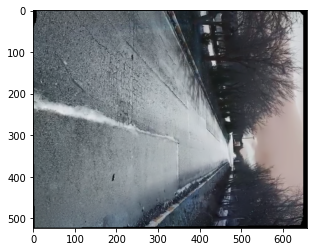

In [ ]:
stitcher = cv2.Stitcher_create(True)
(status, stitched) = stitcher.stitch(frames[0:50])
plt.imshow(stitched)

In [ ]:
stitched.shape

(523, 659, 3)

In [ ]:
frames = frames[0:47]

In [ ]:
interval=50
(status, stitched) = stitcher.stitch(frames[0:interval])
if status==0:
  res = stitched.copy()
  for i in range(1,len(frames)//interval): 
    (status, stitched) = stitcher.stitch([stitched] + frames[i*interval:i*interval+interval])
    if status!=0:
      print(status)
      break
    else:
      stitched = cv2.copyMakeBorder(stitched, 10, 10, 10, 10,
			cv2.BORDER_CONSTANT, (0, 0, 0))
      # convert the stitched image to grayscale and threshold it
      # such that all pixels greater than zero are set to 255
      # (foreground) while all others remain 0 (background)
      gray = cv2.cvtColor(stitched, cv2.COLOR_BGR2GRAY)
      thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY)[1]

      # find all external contours in the threshold image then find
      # the *largest* contour which will be the contour/outline of
      # the stitched image
      cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE)
      cnts = imutils.grab_contours(cnts)
      c = max(cnts, key=cv2.contourArea)
      # allocate memory for the mask which will contain the
      # rectangular bounding box of the stitched image region
      mask = np.zeros(thresh.shape, dtype="uint8")
      (x, y, w, h) = cv2.boundingRect(c)
      cv2.rectangle(mask, (x, y), (x + w, y + h), 255, -1)
      minRect = mask.copy()
      sub = mask.copy()
      # keep looping until there are no non-zero pixels left in the
      # subtracted image
      while cv2.countNonZero(sub) > 0:
        # erode the minimum rectangular mask and then subtract
        # the thresholded image from the minimum rectangular mask
        # so we can count if there are any non-zero pixels left
        minRect = cv2.erode(minRect, None)
        sub = cv2.subtract(minRect, thresh)
      # find contours in the minimum rectangular mask and then
      # extract the bounding box (x, y)-coordinates
      cnts = cv2.findContours(minRect.copy(), cv2.RETR_EXTERNAL,
                              cv2.CHAIN_APPROX_SIMPLE)
      cnts = imutils.grab_contours(cnts)
      c = max(cnts, key=cv2.contourArea)
      (x, y, w, h) = cv2.boundingRect(c)
      # use the bounding box coordinates to extract the our final
      # stitched image
      stitched = stitched[y:y + h, x:x + w]
      res = stitched.copy()


else:
  print(status)

In [ ]:
frames[0].shape

(480, 640, 3)

In [ ]:
res.shape

(349, 581, 3)

In [ ]:
cv2.imwrite('res.jpg', res)

True

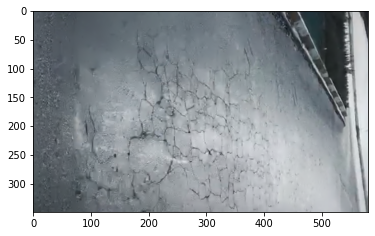

In [ ]:
plt.imshow(res)

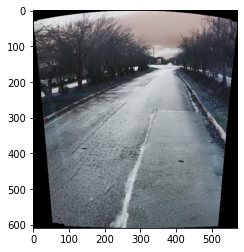

In [ ]:
plt.imshow(stitched)

In [ ]:
def detectAndDescribe(image, method=None):
    """
    Compute key points and feature descriptors using an specific method
    """
    
    assert method is not None, "You need to define a feature detection method. Values are: 'sift', 'surf'"
    
    # detect and extract features from the image
    if method == 'sift':
        descriptor = cv2.xfeatures2d.SIFT_create()
    elif method == 'surf':
        descriptor = cv2.xfeatures2d.SURF_create()
    elif method == 'brisk':
        descriptor = cv2.BRISK_create()
    elif method == 'orb':
        descriptor = cv2.ORB_create()
        
    # get keypoints and descriptors
    (kps, features) = descriptor.detectAndCompute(image, None)
    
    return (kps, features)

In [ ]:
def createMatcher(method,crossCheck):
    "Create and return a Matcher Object"
    
    if method == 'sift' or method == 'surf':
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=crossCheck)
    elif method == 'orb' or method == 'brisk':
        bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=crossCheck)
    return bf

In [ ]:
def matchKeyPointsBF(featuresA, featuresB, method):
    bf = createMatcher(method, crossCheck=True)
        
    # Match descriptors.
    best_matches = bf.match(featuresA,featuresB)
    
    # Sort the features in order of distance.
    # The points with small distance (more similarity) are ordered first in the vector
    rawMatches = sorted(best_matches, key = lambda x:x.distance)
    return rawMatches

In [ ]:
def matchKeyPointsKNN(featuresA, featuresB, ratio, method):
    bf = createMatcher(method, crossCheck=False)
    # compute the raw matches and initialize the list of actual matches
    rawMatches = bf.knnMatch(featuresA, featuresB, 2)
    matches = []

    # loop over the raw matches
    for m,n in rawMatches:
        # ensure the distance is within a certain ratio of each
        # other (i.e. Lowe's ratio test)
        if m.distance < n.distance * ratio:
            matches.append(m)
    return matches

In [ ]:
def getHomography(kpsA, kpsB, featuresA, featuresB, matches, reprojThresh):
    # convert the keypoints to numpy arrays
    kpsA = np.float32([kp.pt for kp in kpsA])
    kpsB = np.float32([kp.pt for kp in kpsB])
    
    if len(matches) > 4:

        # construct the two sets of points
        ptsA = np.float32([kpsA[m.queryIdx] for m in matches])
        ptsB = np.float32([kpsB[m.trainIdx] for m in matches])
        
        # estimate the homography between the sets of points
        (H, status) = cv2.findHomography(ptsA, ptsB, cv2.RANSAC,
            reprojThresh)

        return (matches, H, status)
    else:
        return None

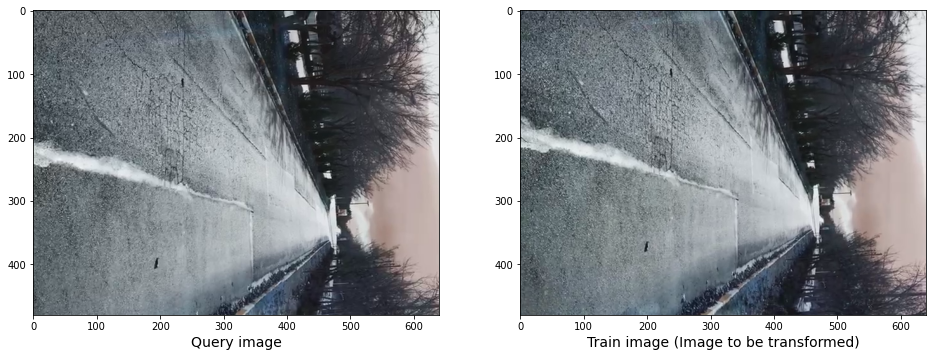

In [ ]:
# select the image id (valid values 1,2,3, or 4)
feature_extractor = 'orb' # one of 'sift', 'surf', 'brisk', 'orb'
feature_matching = 'bf'

# read images and transform them to grayscale
# Make sure that the train image is the image that will be transformed
trainImg =frames[1]
trainImg_gray = cv2.cvtColor(trainImg, cv2.COLOR_RGB2GRAY)

queryImg = frames[2]
# Opencv defines the color channel in the order BGR. 
# Transform it to RGB to be compatible to matplotlib
queryImg_gray = cv2.cvtColor(queryImg, cv2.COLOR_RGB2GRAY)

fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, constrained_layout=False, figsize=(16,9))
ax1.imshow(queryImg, cmap="gray")
ax1.set_xlabel("Query image", fontsize=14)

ax2.imshow(trainImg, cmap="gray")
ax2.set_xlabel("Train image (Image to be transformed)", fontsize=14)

plt.show()



In [ ]:
kpsA, featuresA = detectAndDescribe(trainImg_gray, method=feature_extractor)
kpsB, featuresB = detectAndDescribe(queryImg_gray, method=feature_extractor)

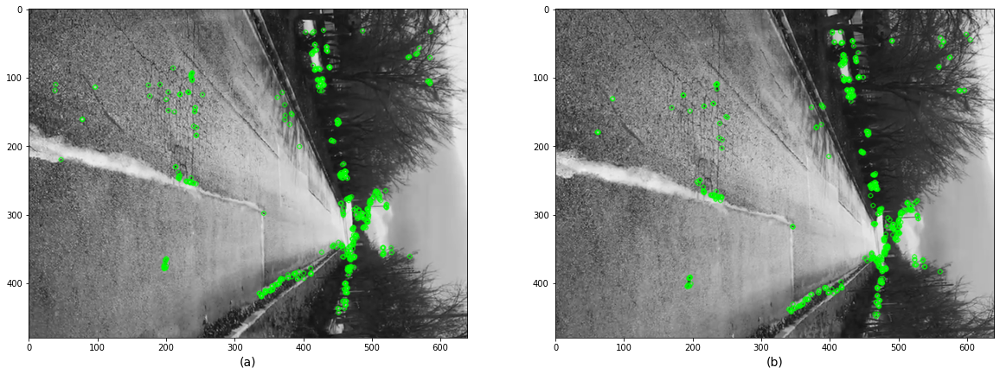

In [ ]:
# display the keypoints and features detected on both images
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20,8), constrained_layout=False)
ax1.imshow(cv2.drawKeypoints(trainImg_gray,kpsA,None,color=(0,255,0)))
ax1.set_xlabel("(a)", fontsize=14)
ax2.imshow(cv2.drawKeypoints(queryImg_gray,kpsB,None,color=(0,255,0)))
ax2.set_xlabel("(b)", fontsize=14)

plt.show()

Using: bf feature matcher
Raw matches (Brute force): 319


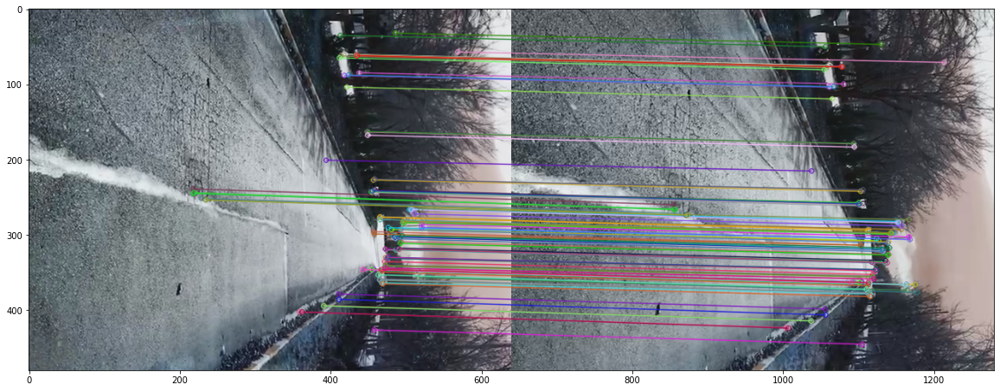

In [ ]:
print("Using: {} feature matcher".format(feature_matching))

fig = plt.figure(figsize=(20,8))

if feature_matching == 'bf':
    matches = matchKeyPointsBF(featuresA, featuresB, method=feature_extractor)
    img3 = cv2.drawMatches(trainImg,kpsA,queryImg,kpsB,matches[:100],
                           None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
elif feature_matching == 'knn':
    matches = matchKeyPointsKNN(featuresA, featuresB, ratio=0.75, method=feature_extractor)
    img3 = cv2.drawMatches(trainImg,kpsA,queryImg,kpsB,np.random.choice(matches,100),
                           None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    

plt.imshow(img3)
plt.show()

In [ ]:
M = getHomography(kpsA, kpsB, featuresA, featuresB, matches, reprojThresh=4)
if M is None:
    print("Error!")
(matches, H, status) = M
print(H)

[[ 1.10858181e+00  1.41942519e-03 -2.35679152e+01]
 [ 1.01243609e-02  1.04970077e+00  1.13090499e+01]
 [ 1.08734144e-04 -1.98120547e-05  1.00000000e+00]]


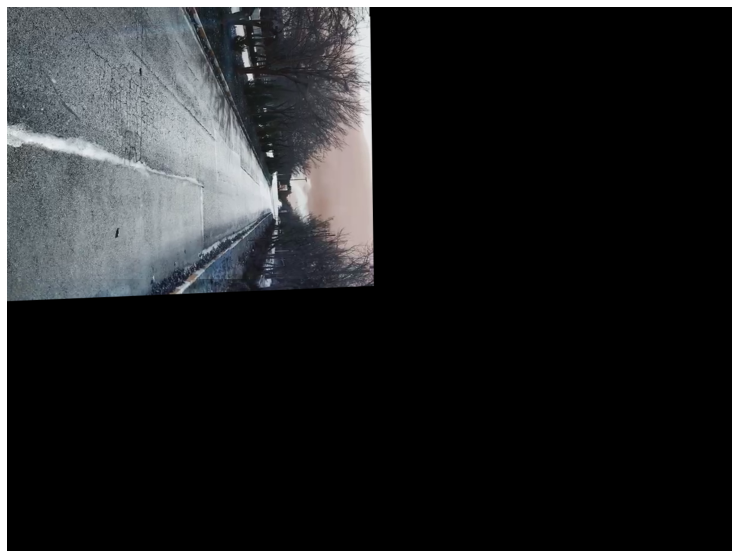

In [ ]:
# Apply panorama correction
width = trainImg.shape[1] + queryImg.shape[1]
height = trainImg.shape[0] + queryImg.shape[0]

result = cv2.warpPerspective(trainImg, H, (width, height))
result[0:queryImg.shape[0], 0:queryImg.shape[1]] = queryImg

plt.figure(figsize=(20,10))
plt.imshow(result)

plt.axis('off')
plt.show()

521

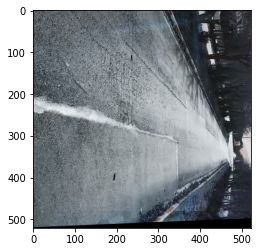

In [ ]:
gray = cv2.cvtColor(result, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY)[1]
kernel = np.ones((5,5),np.uint8)
dilation = cv2.dilate(thresh,kernel,iterations = 1)
y0 = np.min(np.where(dilation==255)[0])
x0 = np.min(np.where(dilation==255)[0])
x1 = np.max(np.where(dilation==255)[0])
y1 = np.max(np.where(dilation==255)[0])
result = result[y0:y1, x0:x1]
plt.imshow(result)

In [ ]:
result = cv2.copyMakeBorder(result, 10, 10, 10, 10,
cv2.BORDER_CONSTANT, (0, 0, 0))
# convert the stitched image to grayscale and threshold it
# such that all pixels greater than zero are set to 255
# (foreground) while all others remain 0 (background)
gray = cv2.cvtColor(result, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY)[1]

# find all external contours in the threshold image then find
# the *largest* contour which will be the contour/outline of
# the stitched image
cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL,
  cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)
c = max(cnts, key=cv2.contourArea)
# allocate memory for the mask which will contain the
# rectangular bounding box of the stitched image region
mask = np.zeros(thresh.shape, dtype="uint8")
(x, y, w, h) = cv2.boundingRect(c)
cv2.rectangle(mask, (x, y), (x + w, y + h), 255, -1)
minRect = mask.copy()
sub = mask.copy()
# keep looping until there are no non-zero pixels left in the
# subtracted image
while cv2.countNonZero(sub) > 0:
  # erode the minimum rectangular mask and then subtract
  # the thresholded image from the minimum rectangular mask
  # so we can count if there are any non-zero pixels left
  minRect = cv2.erode(minRect, None)
  sub = cv2.subtract(minRect, thresh)
# find contours in the minimum rectangular mask and then
# extract the bounding box (x, y)-coordinates
cnts = cv2.findContours(minRect.copy(), cv2.RETR_EXTERNAL,
                        cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)
c = max(cnts, key=cv2.contourArea)
(x, y, w, h) = cv2.boundingRect(c)
# use the bounding box coordinates to extract the our final
# stitched image
result = result[y:y + h, x:x + w]

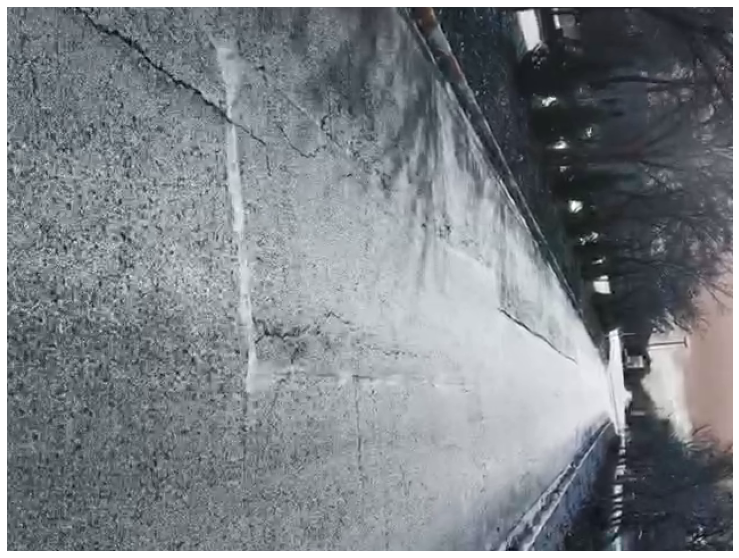

In [ ]:
plt.figure(figsize=(20,10))
plt.imshow(result)

plt.axis('off')
plt.show()

In [ ]:
result.shape

(479, 639, 3)

In [ ]:
def panorama(a, b, feature_extractor = 'orb', feature_matching = 'bf', disp= False):
  # read images and transform them to grayscale
  # Make sure that the train image is the image that will be transformed
  trainImg =a
  trainImg_gray = cv2.cvtColor(trainImg, cv2.COLOR_RGB2GRAY)

  queryImg = b
  # Opencv defines the color channel in the order BGR. 
  # Transform it to RGB to be compatible to matplotlib
  queryImg_gray = cv2.cvtColor(queryImg, cv2.COLOR_RGB2GRAY)
  if disp:
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, constrained_layout=False, figsize=(16,9))
    ax1.imshow(queryImg, cmap="gray")
    ax1.set_xlabel("Query image", fontsize=14)

    ax2.imshow(trainImg, cmap="gray")
    ax2.set_xlabel("Train image (Image to be transformed)", fontsize=14)

    plt.show()
  kpsA, featuresA = detectAndDescribe(trainImg_gray, method=feature_extractor)
  kpsB, featuresB = detectAndDescribe(queryImg_gray, method=feature_extractor)
  if disp:
    # display the keypoints and features detected on both images
    fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20,8), constrained_layout=False)
    ax1.imshow(cv2.drawKeypoints(trainImg_gray,kpsA,None,color=(0,255,0)))
    ax1.set_xlabel("(a)", fontsize=14)
    ax2.imshow(cv2.drawKeypoints(queryImg_gray,kpsB,None,color=(0,255,0)))
    ax2.set_xlabel("(b)", fontsize=14)

    plt.show()
    print("Using: {} feature matcher".format(feature_matching))

  

  if feature_matching == 'bf':
      matches = matchKeyPointsBF(featuresA, featuresB, method=feature_extractor)
      img3 = cv2.drawMatches(trainImg,kpsA,queryImg,kpsB,matches[:100],
                            None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
  elif feature_matching == 'knn':
      matches = matchKeyPointsKNN(featuresA, featuresB, ratio=0.75, method=feature_extractor)
      img3 = cv2.drawMatches(trainImg,kpsA,queryImg,kpsB,np.random.choice(matches,100),
                            None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
  if disp:    
    fig = plt.figure(figsize=(20,8))
    plt.imshow(img3)
    plt.show()
  
  M = getHomography(kpsA, kpsB, featuresA, featuresB, matches, reprojThresh=4)
  if M is None:
    print("Error!")
  (matches, H, status) = M
  if disp:
    print(H)
  
  # Apply panorama correction
  width = trainImg.shape[1] + queryImg.shape[1]
  height = trainImg.shape[0] + queryImg.shape[0]

  result = cv2.warpPerspective(trainImg, H, (width, height))
  result[0:queryImg.shape[0], 0:queryImg.shape[1]] = queryImg
  if disp:
    plt.figure(figsize=(20,10))
    plt.imshow(result)

    plt.axis('off')
    plt.show()
  gray = cv2.cvtColor(result, cv2.COLOR_BGR2GRAY)
  thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY)[1]
  kernel = np.ones((5,5),np.uint8)
  dilation = cv2.dilate(thresh,kernel,iterations = 1)
  y0 = np.min(np.where(dilation==255)[0])
  x0 = np.min(np.where(dilation==255)[0])
  x1 = np.max(np.where(dilation==255)[0])
  y1 = np.max(np.where(dilation==255)[0])
  result = result[y0:y1, x0:x1]
  
  #if disp:
  plt.figure(figsize=(20,10))
  plt.imshow(result)

  plt.axis('off')
  plt.show()
  
  return result



In [ ]:
len(frames)

47

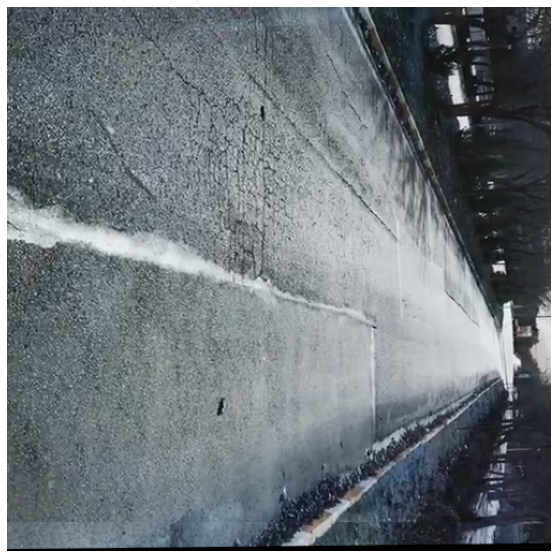

1


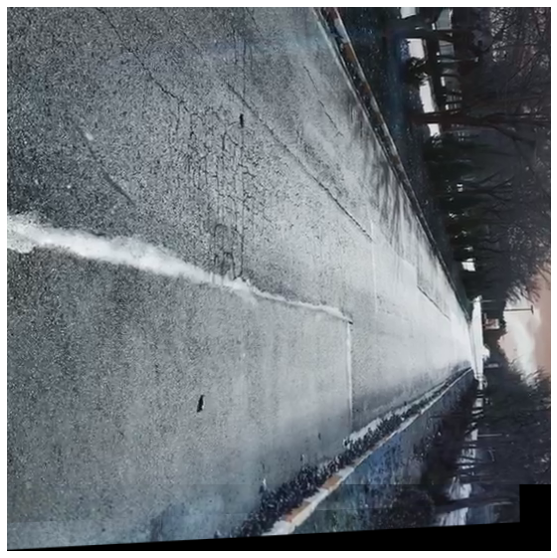

2


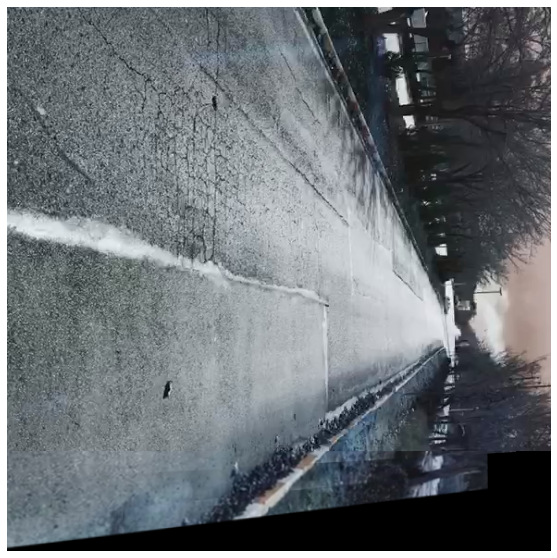

3


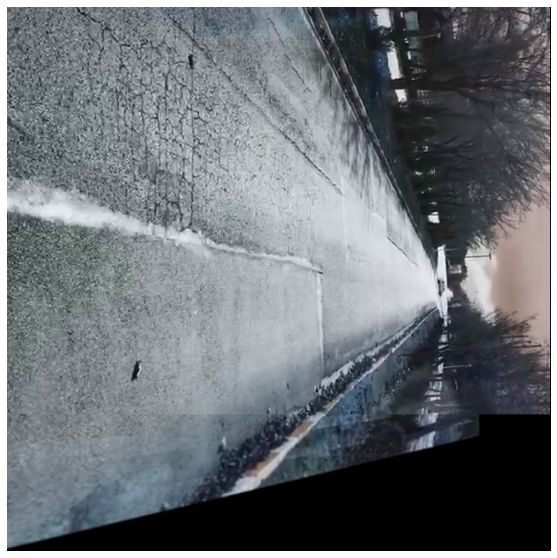

4


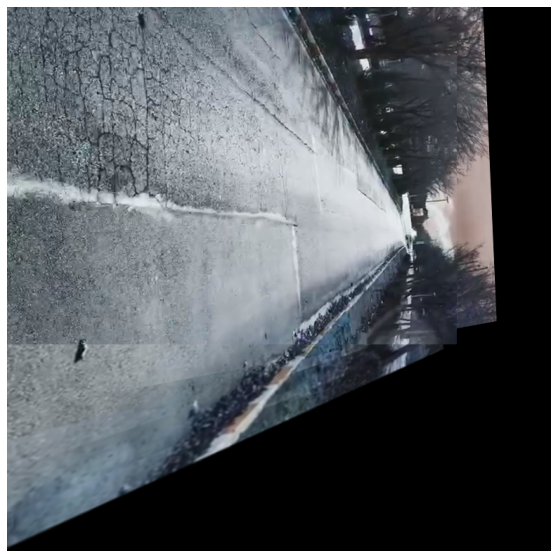

5


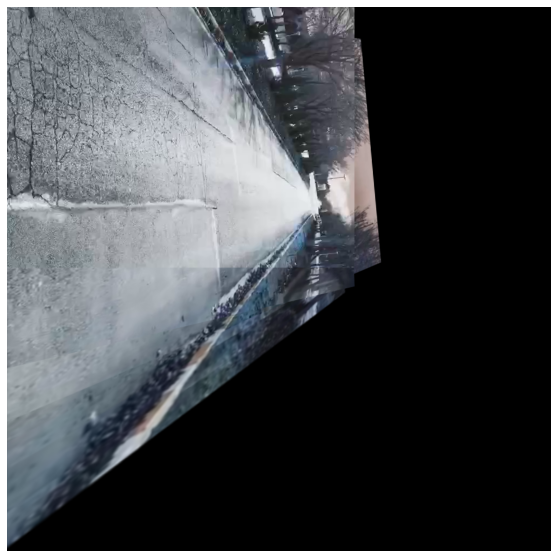

6


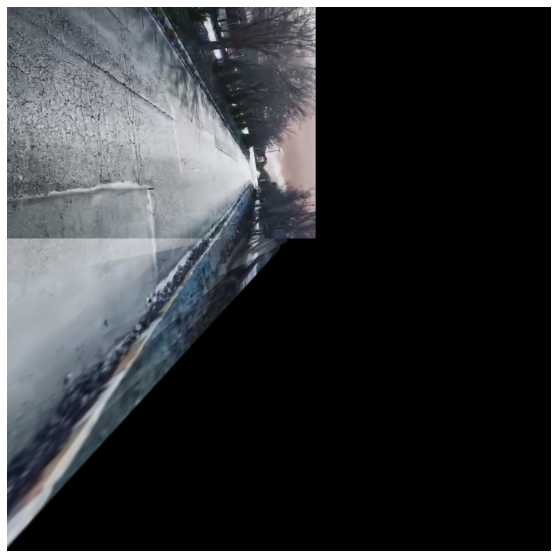

7


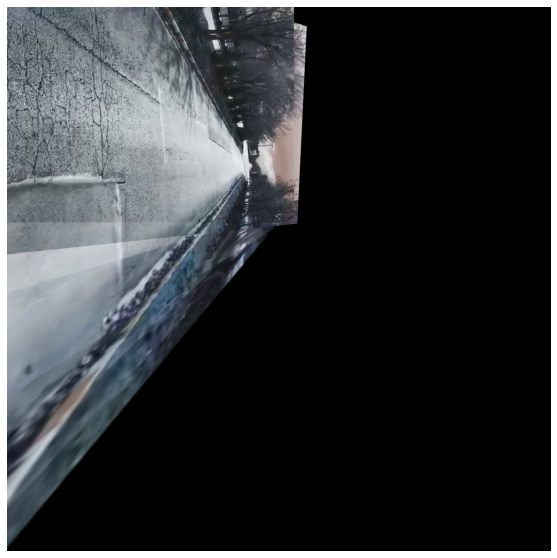

8


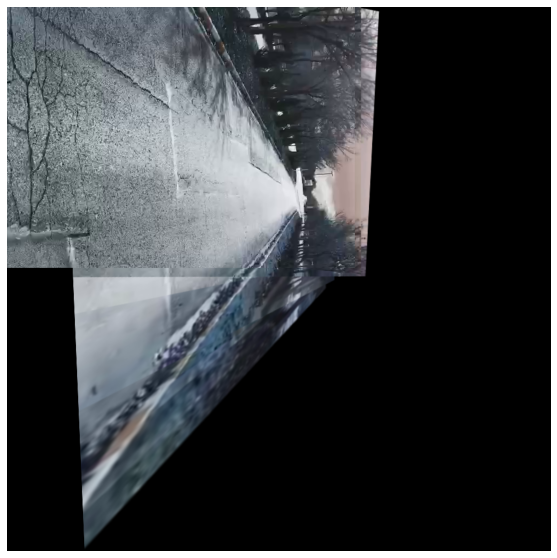

9


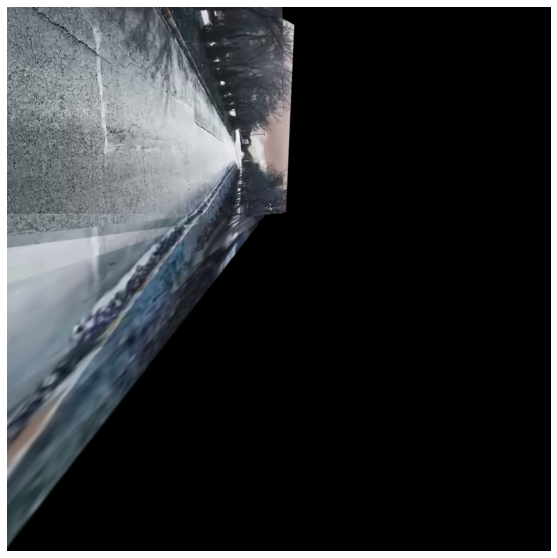

(1264, 1264, 3)

In [ ]:
result = panorama(frames[0], frames[1], feature_extractor = 'orb', feature_matching = 'bf', disp= False)  
for i in range(1, 10):
  print(i)
  result = panorama(result, frames[i+1], feature_extractor = 'orb', feature_matching = 'bf', disp= False)
result.shape

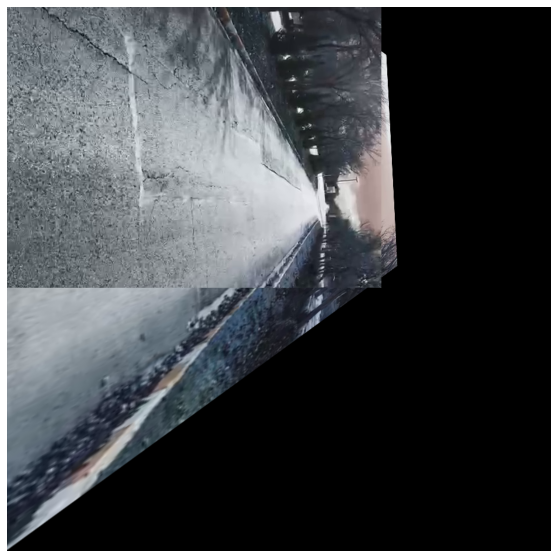

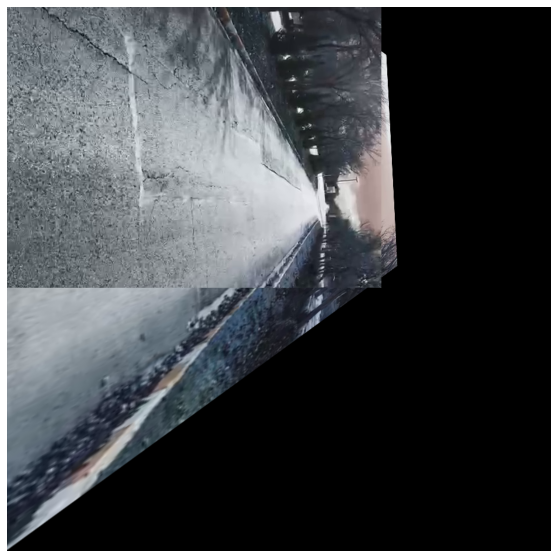

In [ ]:

result = panorama(frames[0], frames[10], feature_extractor = 'orb', feature_matching = 'bf', disp= False)  
plt.figure(figsize=(20,10))
plt.imshow(result)

plt.axis('off')
plt.show()